# <p style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:150%; text-align:center; border-radius:15px 50px; visibility:visible;">Credit Card Usage Segmentation</p>

# <img src="main.png" width="2000" height="1200">

# Table of Contents
<a id="contents_tabel"></a>    
<div style="border-radius:10px; padding: 15px; background-color: lightblue; font-size:115%; text-align:left">

1. [Problem](#problem)
2. [Objective](#objective)
3. [Step 1 | Import Libraries](#import)
4. [Step 2 | Read Dataset](#read)
5. [Step 3 | Dataset Overview](#overview)
6. [Step 4 | EDA](#eda)
   - [Step 4.1 | Univariate Analysis](#univariate)
   - [Step 4.2 |Categorical Variables Univariate Analysis](#categorical)
   - [Step 4.3 | Bivariate Analysis](#bivariate)
7. [Step 5 | Data Preprocessing](#preprocessing)
   - [Step 5.1 | Missing Value Treatment](#missingvalue)
   - [Step 5.2 | Outlier Treatment](#outlier)
8. [Data Spliting](#dataspliting)
9. [Step 6 | Decision Tree Model Building](#decisiontree)
   - [DT Hyperparameter Tuning](#dthyperparameter)
10. [Step 7 | Random Forest Model Building](#random)
    -[RF Hyperparameter Tuning](#rfhyperparameter)
11. [Step 8 | Logistic Regression Model Building](#logistic)
    - [Logistic Regression Hyperparameter Tuning](#logistictuning)
12. [Step 9 | Support Vector Machine (SVM) Model Building](#svc)
    - [SVM Hyperparameter Tuning](#svmhyperparameter)
13. [Step 10 | K-Nearest Neighbors (KNN) Model Building](#knn)
    - [KNN Hyperparameter Tuning](#knntuning)
14. [Step 11 | Model Evaluation & Conclusion](#mandc)
15. [Step 13 | Prediction](#prediction)

<a id="problem"></a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:250%; text-align:center; border-radius:15px 50px; visibility:visible;">Problem</h2>
 # <p style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:70%; text-align:center; border-radius:15px 50px; visibility:visible;">Due to the wide range of costs and payments, credit card companies face challenges in understanding and segmenting consumer behavior. Without proper allocation, these firms struggle to develop marketing strategies, assess credit risk, and manage customer relationships effectively. This project aims to address these challenges through an unsupervised learning process that segments customers based on credit card usage. The goal is to identify actionable insights that can lead to personalized services, better risk management, and customized marketing efforts.</p>

⬆️ [Table of Contents](#contents_tabel)

<a id="objective"></a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:250%; text-align:center; border-radius:15px 50px; visibility:visible;">Objective</h2>

⬆️ [Table of Contents](#contents_tabel)

<div style="border-radius:15px 50px; padding: 15px; background-color: lightblue; font-size:130%; text-align:left; font-family: Arial; color: darkblue;">
    <h3 align="left" style="color:darkblue;">Objectives:</h3>
    <ul>
        <li><strong>Explore the Dataset</strong>: Uncover patterns, distributions, and relationships within the credit card usage data.</li>
        <li><strong>Conduct Extensive Exploratory Data Analysis (EDA)</strong>: Dive deep into the data to understand customer behavior and spending patterns.</li>
        <li><strong>Preprocessing Steps</strong>:</li>
        <ul>
            <li>Remove irrelevant features that do not contribute to customer segmentation.</li>
            <li>Address missing values to ensure data completeness.</li>
            <li>Treat outliers to prevent them from skewing the segmentation results.</li>
            <li>Encode categorical variables for compatibility with clustering algorithms.</li>
            <li>Standardize or normalize features to ensure all data is on a similar scale for clustering.</li>
        </ul>
        <li><strong>Model Building</strong>:</li>
        <ul>
            <li>Develop a clustering pipeline, including scaling where necessary.</li>
            <li>Implement and tune clustering algorithms such as K-Means, Hierarchical Clustering, and DBSCAN.</li>
            <li>Determine the optimal number of clusters that best represent distinct customer segments.</li>
        </ul>
        <li><strong>Evaluate and Compare Model Performance</strong>: Utilize metrics such as silhouette score, Davies-Bouldin index, and within-cluster sum of squares to gauge the effectiveness of the clustering models.</li>
    </ul>
</div>


<a id="import"> </a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:250%; text-align:center; border-radius:15px 50px; visibility:visible;">Step 1 | Import Libraries</h2>

⬆️ [Table of Contents](#contents_tabel)

In [1]:
# =======================================
# Standard Libraries
# =======================================
import warnings
import time
import numpy as np

# =======================================
# Data Manipulation and Analysis
# =======================================
import pandas as pd

# =======================================
# Data Visualization
# =======================================
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
%matplotlib inline

# =======================================
# Scikit-Learn for Machine Learning
# =======================================
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn import tree

# =======================================
# IPython Display and Widgets
# =======================================
from IPython.display import display, HTML, Markdown
import ipywidgets as widgets

# =======================================
# Ignore Warnings
# =======================================
warnings.filterwarnings('ignore')


In [2]:
# Set the resolution of the plotted figures
plt.rcParams['figure.dpi'] = 200

# Configure Seaborn plot styles: Set background color and use dark| grid
sns.set(rc={'axes.facecolor': 'lightblue'}, style='darkgrid')


<a id="read"></a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:250%; text-align:center; border-radius:15px 50px; visibility:visible;">Step 2 | Read Dataset</h2>
⬆️ [Table of Contents](#contents_tabel)

In [3]:
df = pd.read_csv("Customer Data.csv")
df 

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [4]:
# Get the summary statistics for numerical variables
df.describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,8950.0,1564.474828,2081.531879,0.000000,128.281915,873.385231,2054.140036,19043.13856
BALANCE_FREQUENCY,8950.0,0.877271,0.236904,0.000000,0.888889,1.000000,1.000000,1.00000
PURCHASES,8950.0,1003.204834,2136.634782,0.000000,39.635000,361.280000,1110.130000,49039.57000
ONEOFF_PURCHASES,8950.0,592.437371,1659.887917,0.000000,0.000000,38.000000,577.405000,40761.25000
INSTALLMENTS_PURCHASES,8950.0,411.067645,904.338115,0.000000,0.000000,89.000000,468.637500,22500.00000
CASH_ADVANCE,8950.0,978.871112,2097.163877,0.000000,0.000000,0.000000,1113.821139,47137.21176
PURCHASES_FREQUENCY,8950.0,0.490351,0.401371,0.000000,0.083333,0.500000,0.916667,1.00000
ONEOFF_PURCHASES_FREQUENCY,8950.0,0.202458,0.298336,0.000000,0.000000,0.083333,0.300000,1.00000
PURCHASES_INSTALLMENTS_FREQUENCY,8950.0,0.364437,0.397448,0.000000,0.000000,0.166667,0.750000,1.00000
CASH_ADVANCE_FREQUENCY,8950.0,0.135144,0.200121,0.000000,0.000000,0.000000,0.222222,1.50000



<div style="border-radius:15px 50px; padding: 15px; background-color:lightblue; font-family:Arial; color:darkblue; font-size:120%; text-align:left">

<h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:150%; text-align:left; border-radius:15px 50px; visibility:visible;">Dataset Description:</h2>
    
| __Variable__ | __Description__ |
| --- | --- | 
| __CUST_ID__ | Unique identifier for each customer |
| __BALANCE__ | The balance amount on the credit card |
| __BALANCE_FREQUENCY__ | Frequency of balance updates: <br> 0 = least frequent <br> 1 = most frequent |
| __PURCHASES__ | Total amount of purchases made |
| __ONEOFF_PURCHASES__ | Amount spent on one-off purchases |
| __INSTALLMENTS_PURCHASES__ | Amount spent on installment purchases |
| __CASH_ADVANCE__ | Cash advance amount taken by the customer |
| __PURCHASES_FREQUENCY__ | Frequency of purchases made: <br> 0 = least frequent <br> 1 = most frequent |
| __ONEOFF_PURCHASES_FREQUENCY__ | Frequency of one-off purchases: <br> 0 = least frequent <br> 1 = most frequent |
| __PURCHASES_INSTALLMENTS_FREQUENCY__ | Frequency of installment purchases: <br> 0 = least frequent <br> 1 = most frequent |
| __CASH_ADVANCE_FREQUENCY__ | Frequency of cash advances: <br> 0 = least frequent <br> 1 = most frequent |
| __CASH_ADVANCE_TRX__ | Number of cash advance transactions |
| __PURCHASES_TRX__ | Number of purchase transactions |
| __CREDIT_LIMIT__ | Credit limit assigned to the customer |
| __PAYMENTS__ | Total payments made by the customer |
| __MINIMUM_PAYMENTS__ | Minimum payments made by the customer |
| __PRC_FULL_PAYMENT__ | Percentage of full payments made |
| __TENURE__ | Number of months the customer has been with the bank |

</div>



<a id="overview"></a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:250%; text-align:center; border-radius:15px 50px; visibility:visible;">Step 3 | Dataset Overview</h2>
⬆️ [Table of Contents](#contents_tabel)

In [5]:
# Display a concise summary of the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA


<div style="border-radius:15px 50px; padding: 15px; background-color:lightblue; font-family:Arial; color:darkblue; font-size:115%; text-align:left">

<h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:150%; text-align:left; border-radius:15px 50px; visibility:visible;">Inferences:</h2>

* __Number of Entries__: The dataset consists of __8950 entries__, ranging from index 0 to 8949.
    
* __Columns__: There are __18 columns__ in the dataset corresponding to various attributes of the customers' credit card usage.
    
* __Data Types__:
    - The majority of the columns (14 out of 18) are of the __float64__ data type.
    - There are __3 columns__ with the __int64__ data type.
    - There is __1 column__ (CUST_ID) with the __object__ data type.
    
* __Missing Values__: 
    - The __CREDIT_LIMIT__ column has 1 missing value.
    - The __MINIMUM_PAYMENTS__ column has 313 missing values.

</div>



In [6]:
continuous_features = ["BALANCE","BALANCE_FREQUENCY","PURCHASES","ONEOFF_PURCHASES","INSTALLMENTS_PURCHASES",
                      "CASH_ADVANCE", "PURCHASES_FREQUENCY", "ONEOFF_PURCHASES_FREQUENCY", "PURCHASES_INSTALLMENTS_FREQUENCY", "CASH_ADVANCE_FREQUENCY",
                      "CASH_ADVANCE_TRX", "PURCHASES_TRX", "CREDIT_LIMIT", "PAYMENTS","MINIMUM_PAYMENTS", "PRC_FULL_PAYMENT"]

In [7]:
# Get the summary statistics for categorical variables
df.describe(include='object')

,CUST_ID
count,8950
unique,8950
top,C10001
freq,1


<a id="eda"> </a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:250%; text-align:center; border-radius:15px 50px; visibility:visible;">Step 4 | EDA</h2>
⬆️ [Table of Contents](#contents_tabel)

<a id="univariate"></a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:150%; text-align:left; border-radius:15px 50px; visibility:visible;">Step 4.1 | Univariate Analysis</h2>


<a id="num_uni"></a>
### <span style='color:white'> Numerical Variables Univariate Analysis</span></b>  

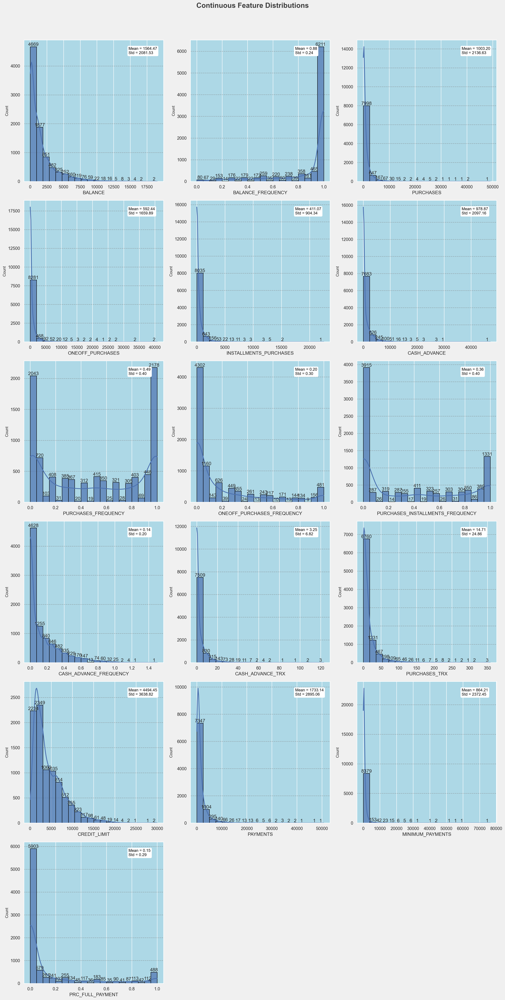

In [8]:
# Filter out continuous features for the univariate analysis
df_continuous = df[continuous_features]

# Set up the subplot grid dynamically based on the number of continuous features
n_features = len(df_continuous.columns)
n_cols = 3  # Fixed number of columns for display
n_rows = (n_features // n_cols) + (n_features % n_cols > 0)  # Calculate required number of rows

fig, ax = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(18, 6 * n_rows))
fig.patch.set_facecolor('#f0f0f0')  # Setting background color

# Flatten the axes array for easy iteration
axes = ax.flatten()

# Loop to plot histograms for each continuous feature
for i, col in enumerate(df_continuous.columns):
    # Calculate bins dynamically
    values, bin_edges = np.histogram(df_continuous[col], bins=20, range=(df_continuous[col].min(), df_continuous[col].max()))
    
    sns.histplot(data=df_continuous, x=col, bins=bin_edges, kde=True, ax=axes[i],
                 edgecolor='black', color='#4c72b0', alpha=0.7, line_kws={'lw': 2, 'color': '#55a868'})
    
    axes[i].set_xlabel(col, fontsize=12)
    axes[i].set_ylabel('Count', fontsize=10)
    axes[i].grid(axis='y', linestyle='--', color='grey', alpha=0.6)

    # Adding mean and standard deviation text
    mean = df_continuous[col].mean()
    std = df_continuous[col].std()
    textstr = f'Mean = {mean:.2f}\nStd = {std:.2f}'
    axes[i].text(0.75, 0.95, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', color='black',
                 bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='none'))

    # Annotating the counts
    for p in axes[i].patches:
        if p.get_height() > 0:
            axes[i].annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                             ha='center', va='center', xytext=(0, 5), textcoords='offset points')

# Hide any unused subplots
for j in range(n_features, len(axes)):
    axes[j].set_visible(False)

plt.suptitle('Continuous Feature Distributions', fontsize=18, fontweight='bold', color='#3c3c3c')
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

The image shows the distribution of continuous features related to credit card usage. Most features, such as balance, purchases, and payments, exhibit a right-skewed distribution, indicating that the majority of customers fall into lower ranges for these variables, with a small number showing significantly higher values. This pattern suggests that while a few customers have high spending and credit utilization, the majority are relatively moderate users.

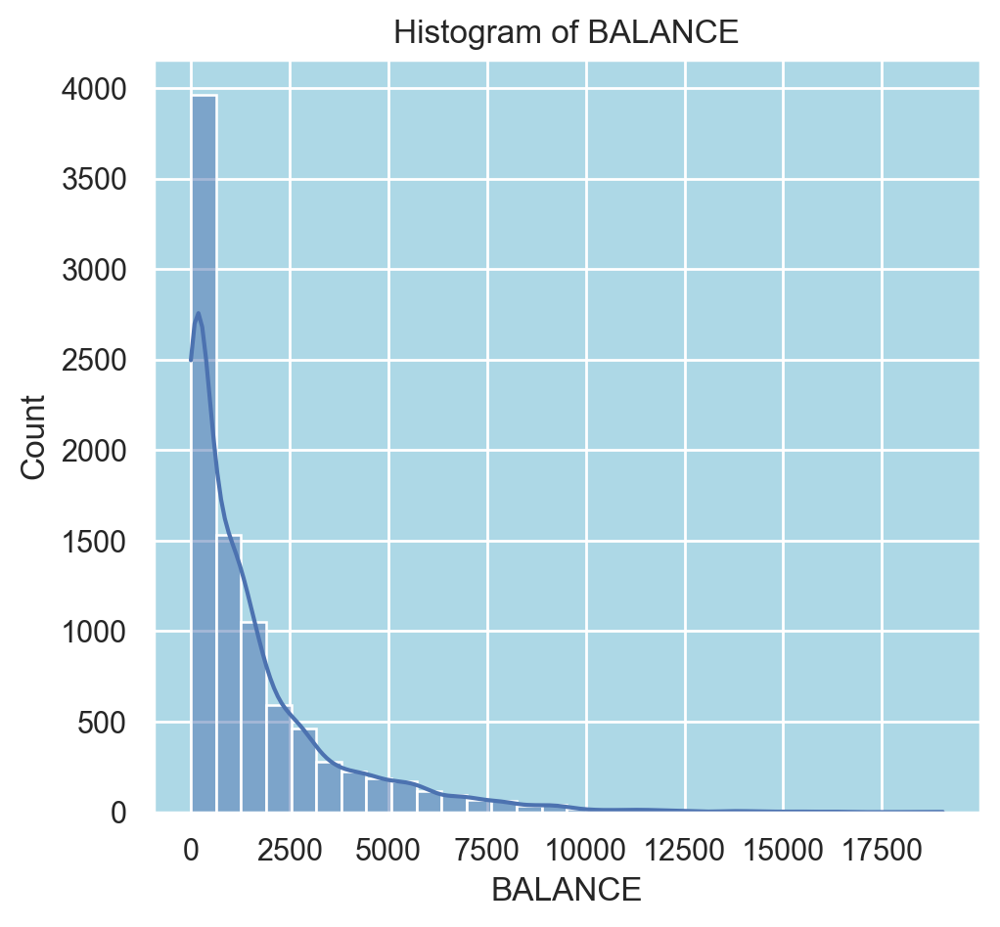

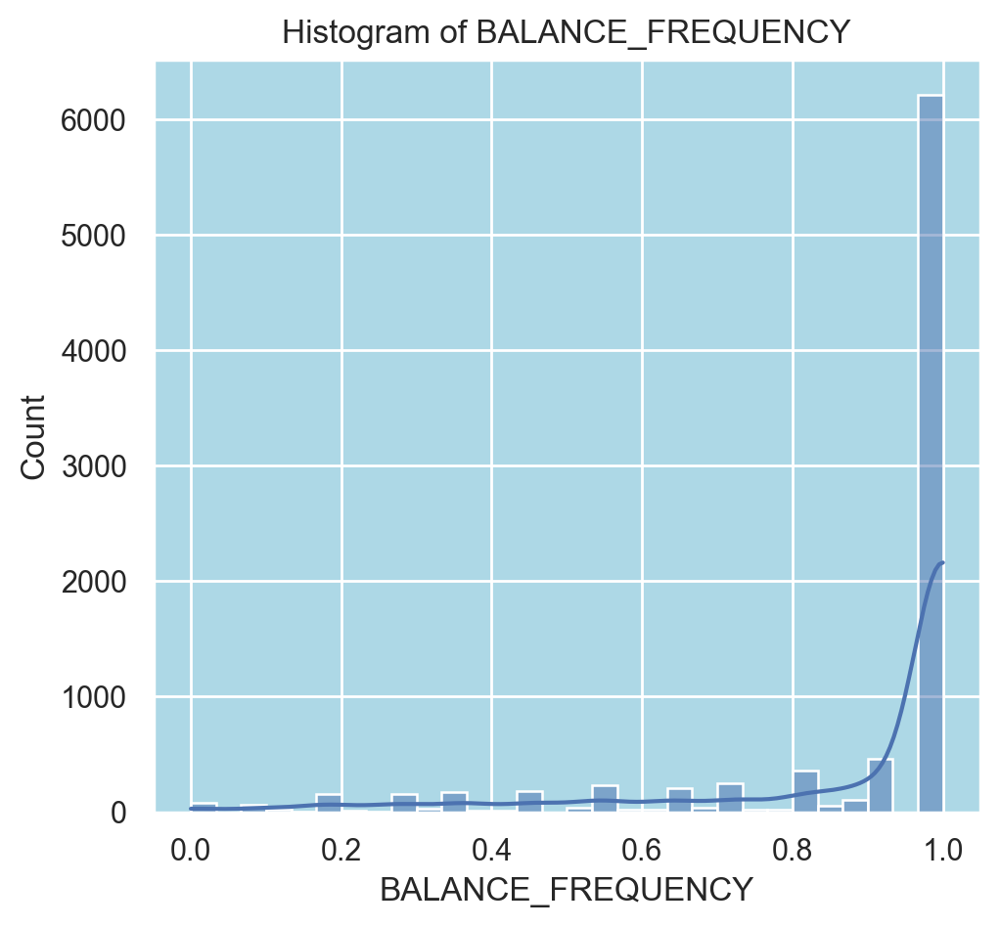

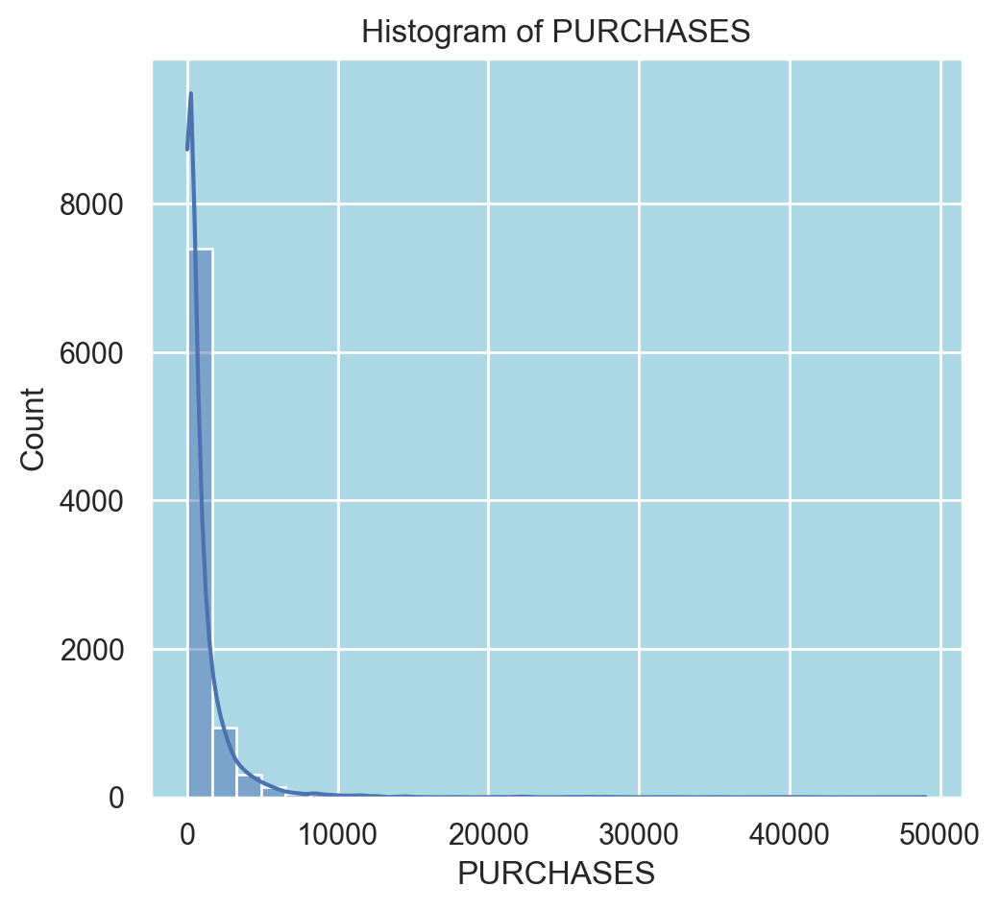

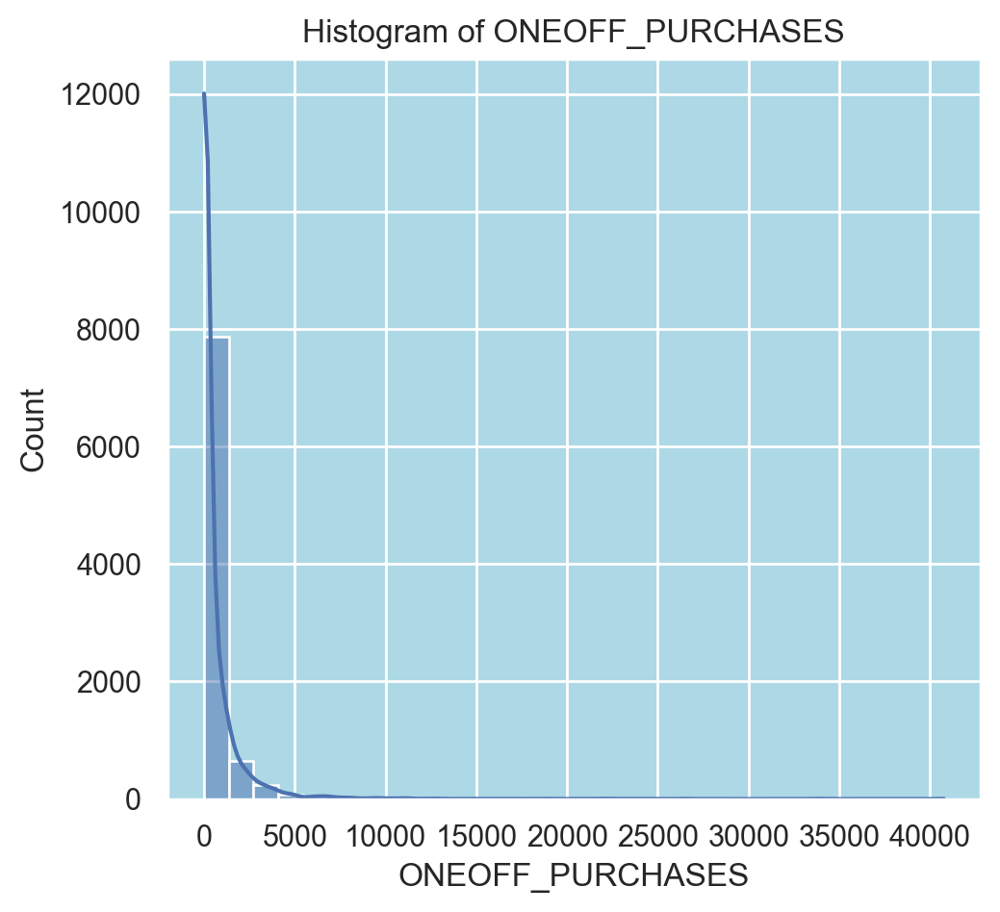

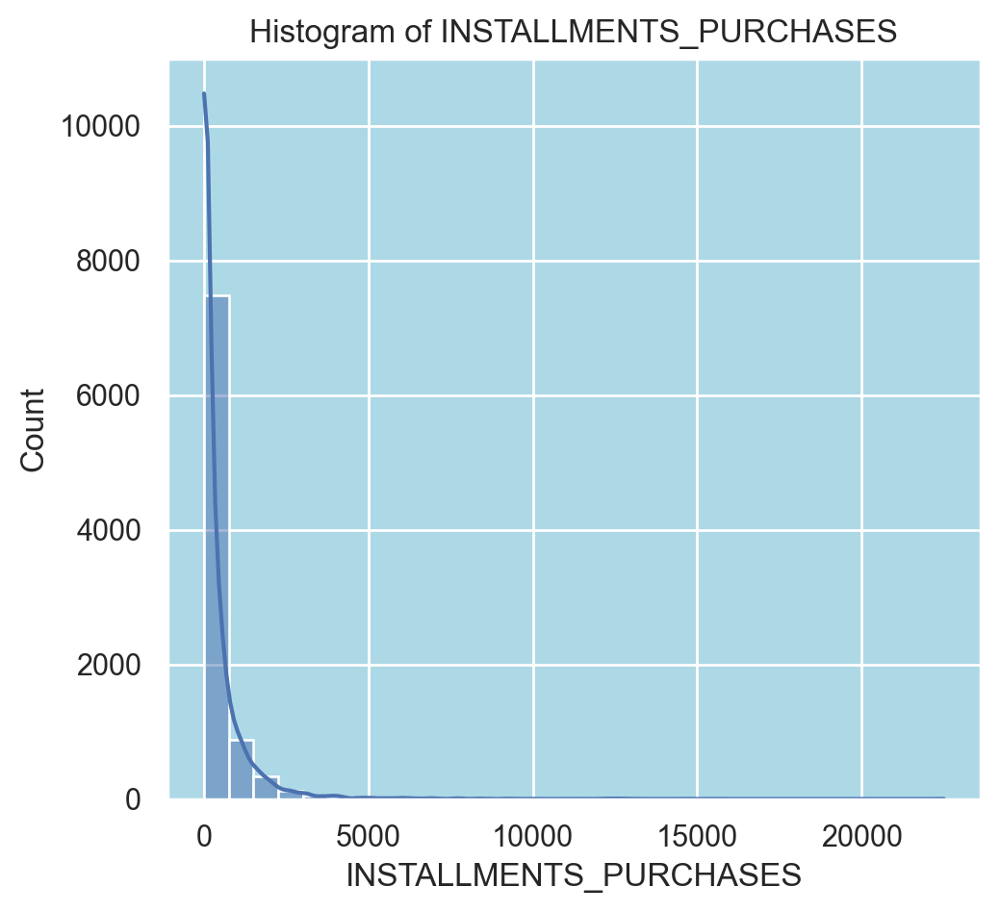

...

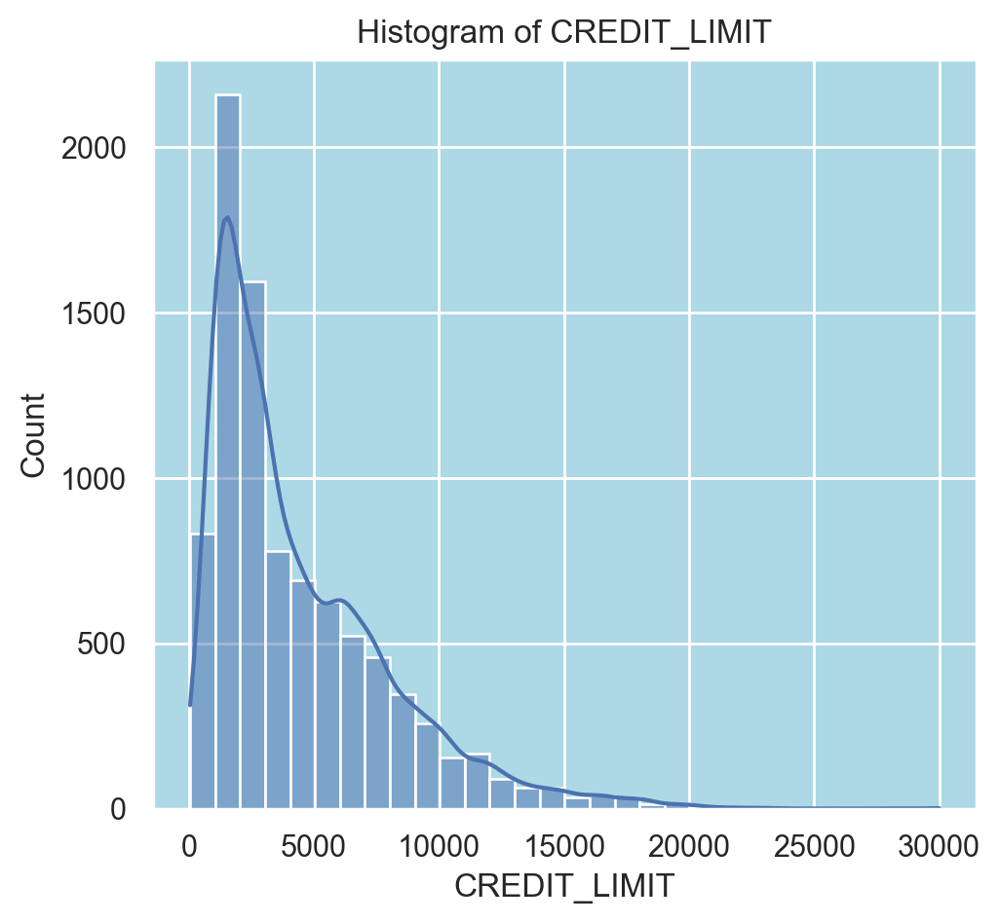

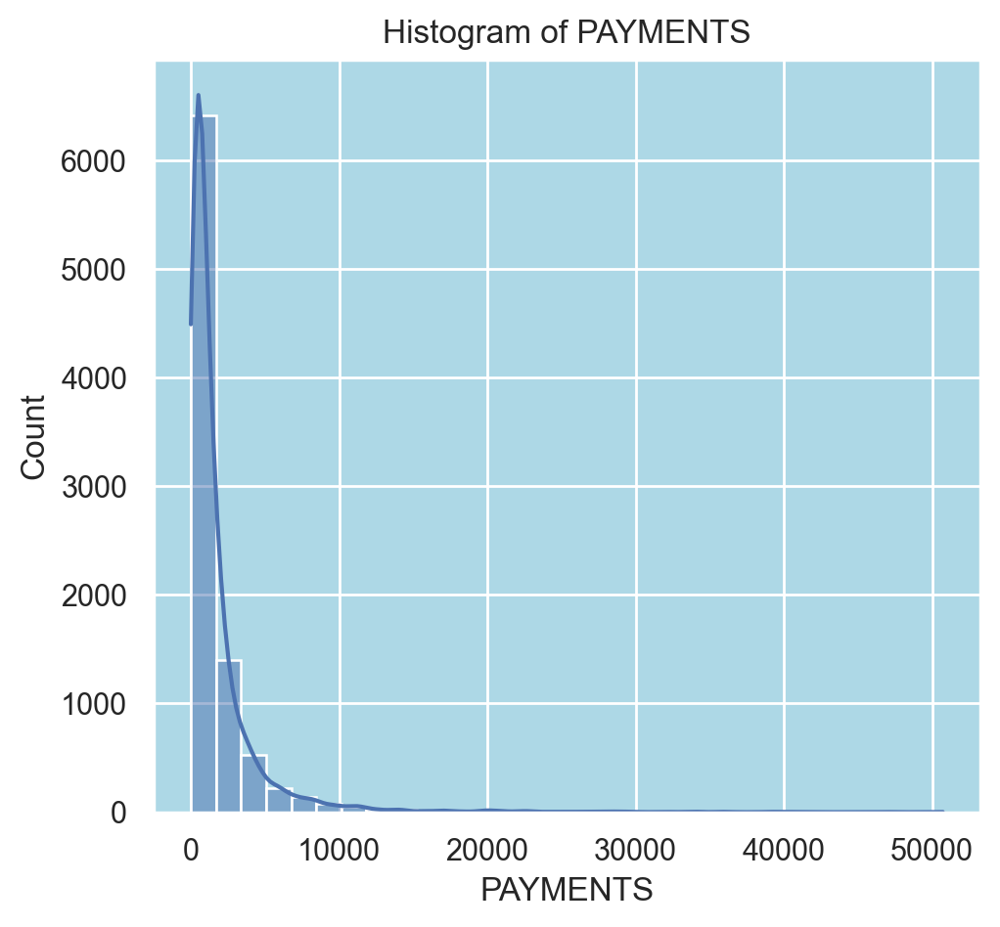

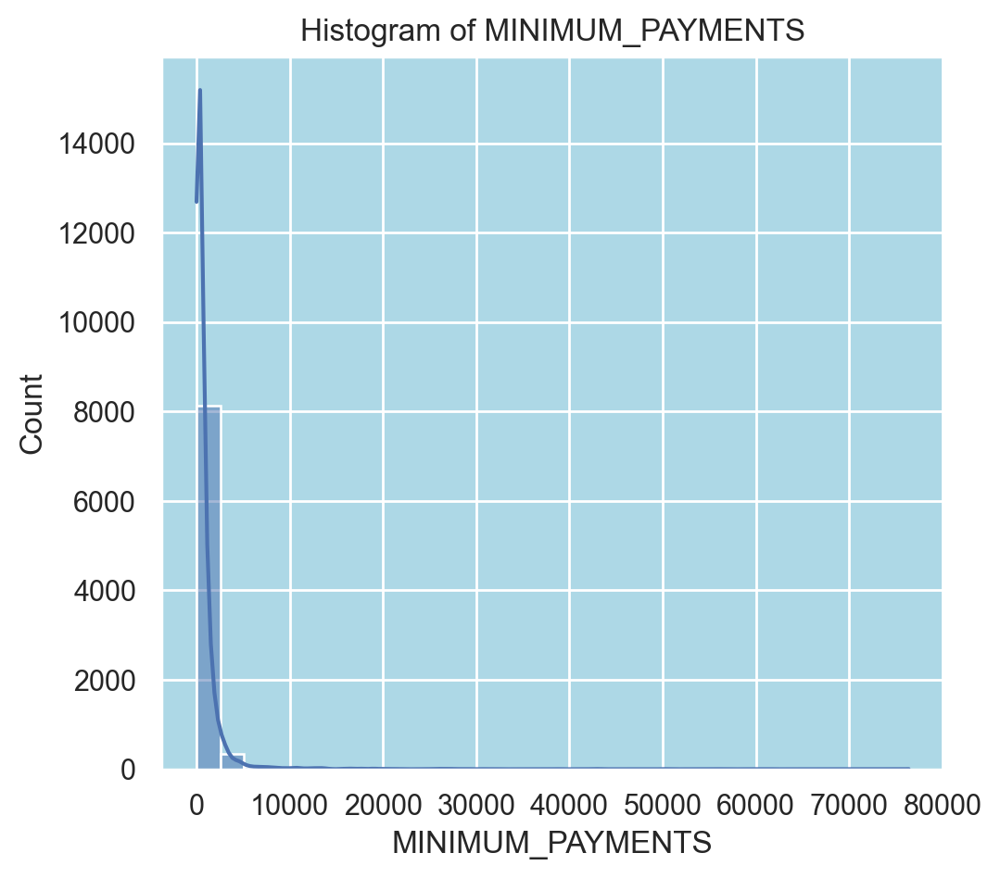

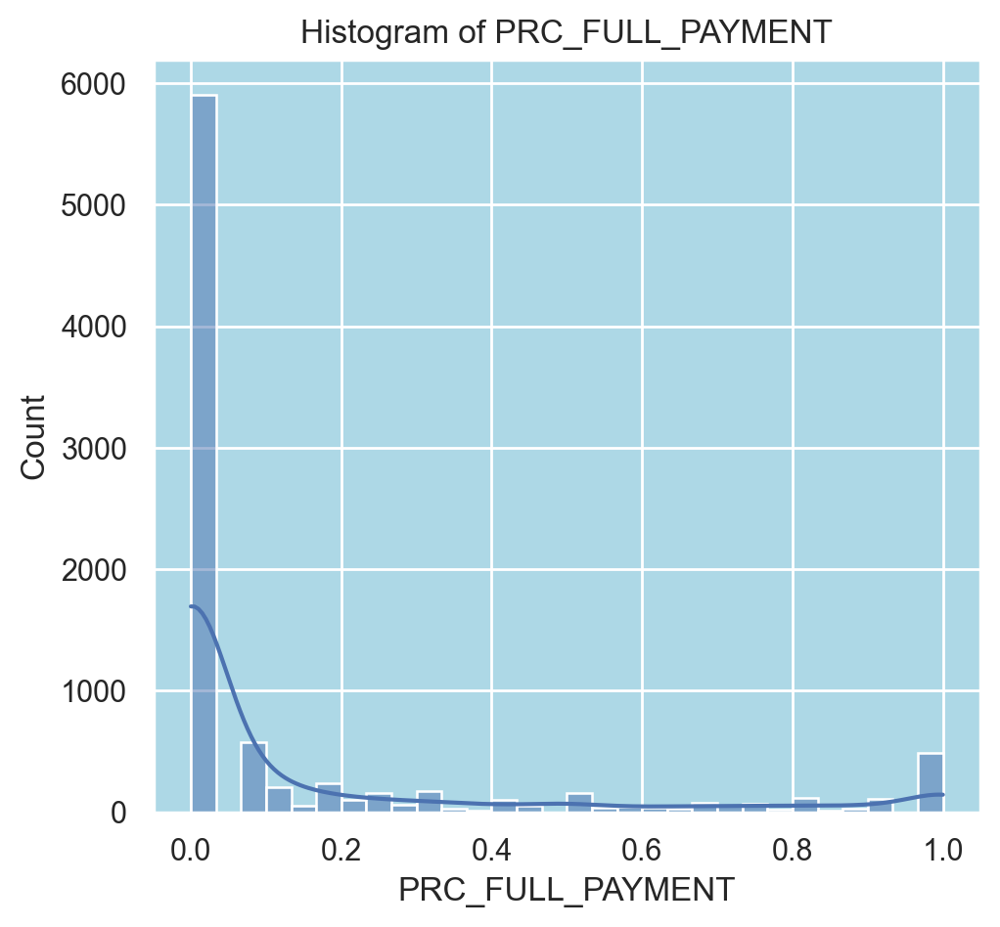

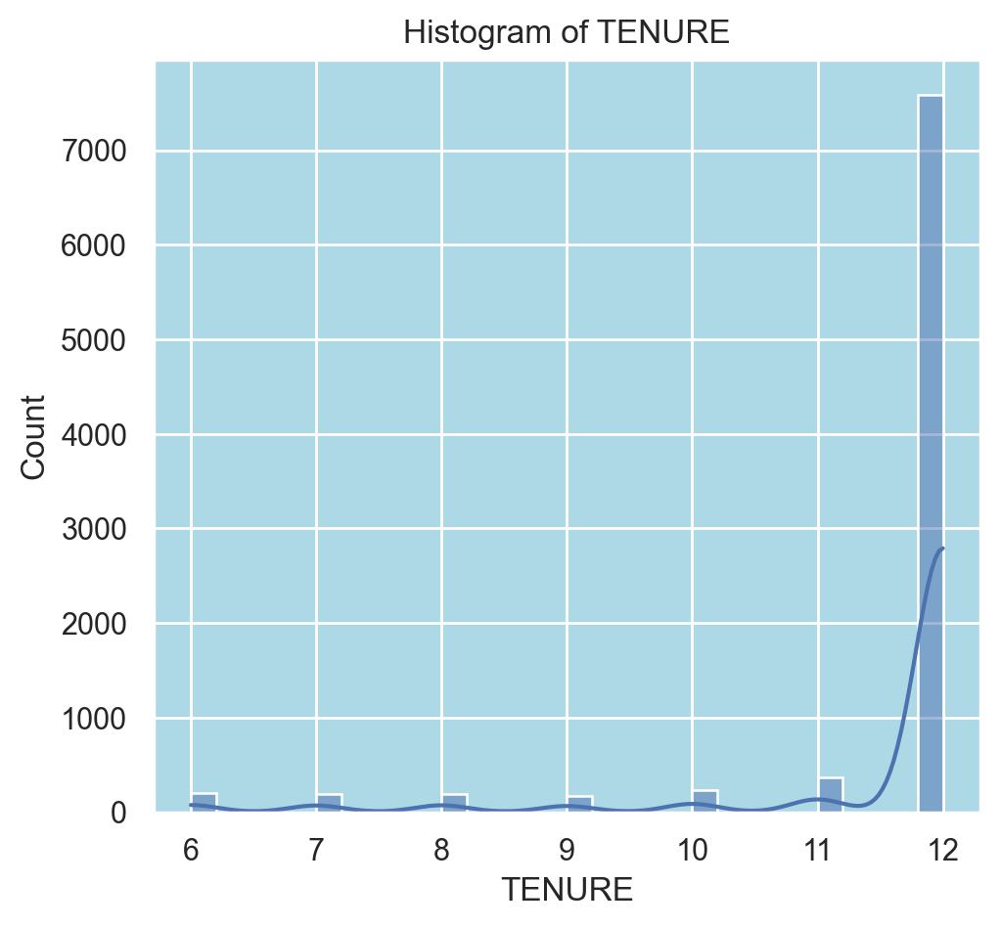

In [9]:
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Plot histograms and box plots for each numerical variable one by one
for column in numerical_columns:
    plt.figure(figsize=(12, 5))
    
    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(df[column], bins=30, kde=True)
    plt.title(f'Histogram of {column}')
       
    # Show plots one by one
    plt.show()

The graph displays the distribution and boxplot of the "Balance" feature. The histogram shows that most customers have lower balances, with a sharp decline as the balance increases. The boxplot indicates a significant number of outliers with very high balances, suggesting that while most customers have modest balances, a few hold considerably larger amounts.

<a id="categorical"> </a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:150%; text-align:left; border-radius:15px 50px; visibility:visible;">Categorical Variables Univariate Analysis</h2>
⬆️ [Table of Contents](#contents_tabel)

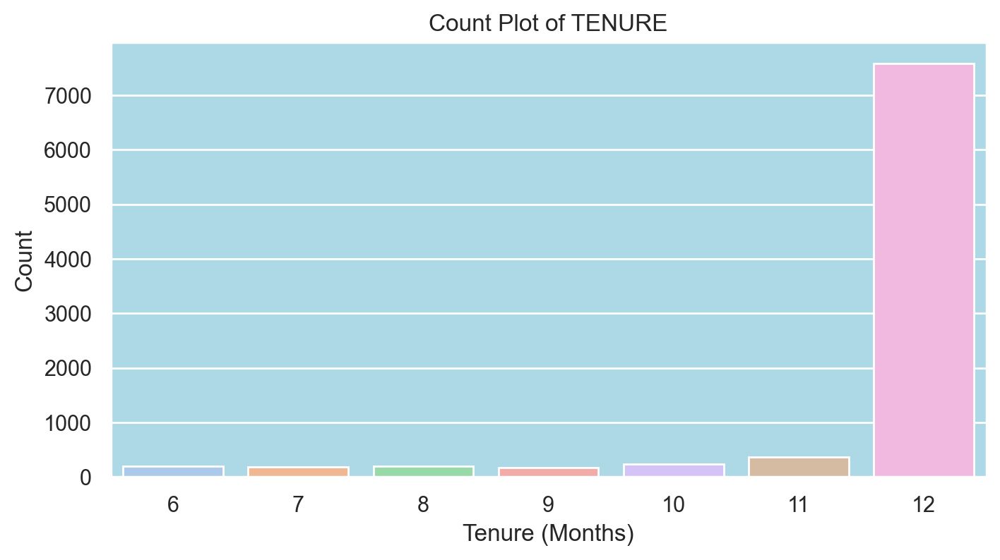

In [10]:
# Plot the count plot for the 'TENURE' column
plt.figure(figsize=(8, 4))
sns.countplot(x='TENURE', data=df, palette='pastel')
plt.title('Count Plot of TENURE')
plt.xlabel('Tenure (Months)')
plt.ylabel('Count')
plt.show()


The count plot of "Tenure" shows that the majority of customers have been with the company for 12 months, with a significantly higher count compared to other months. This suggests a high retention rate for customers with a tenure of one year, while the remaining months show relatively low customer counts.

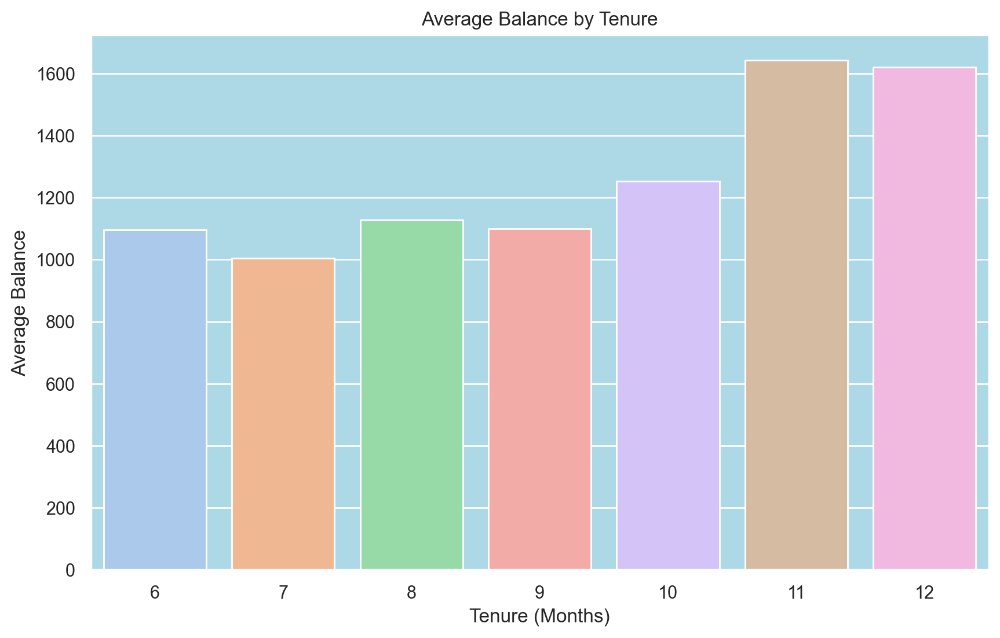

In [11]:
# Calculate the average balance for each tenure group
avg_balance_per_tenure = df.groupby('TENURE')['BALANCE'].mean().reset_index()

# Plot the bar plot for the average balance per tenure group
plt.figure(figsize=(10, 6))
sns.barplot(x='TENURE', y='BALANCE', data=avg_balance_per_tenure, palette='pastel')
plt.title('Average Balance by Tenure')
plt.xlabel('Tenure (Months)')
plt.ylabel('Average Balance')
plt.show()


The bar chart shows that the average balance increases with tenure, peaking at 11 and 12 months. Customers with longer tenure tend to maintain higher average balances on their credit cards.

<a id="bivariate"> </a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:150%; text-align:left; border-radius:15px 50px; visibility:visible;">Step 4.2 | Bivariate Analysis</h2>
⬆️ [Table of Contents](#contents_tabel)

### This scatter plot will show how the total purchases made by customers relate to their credit card balance.

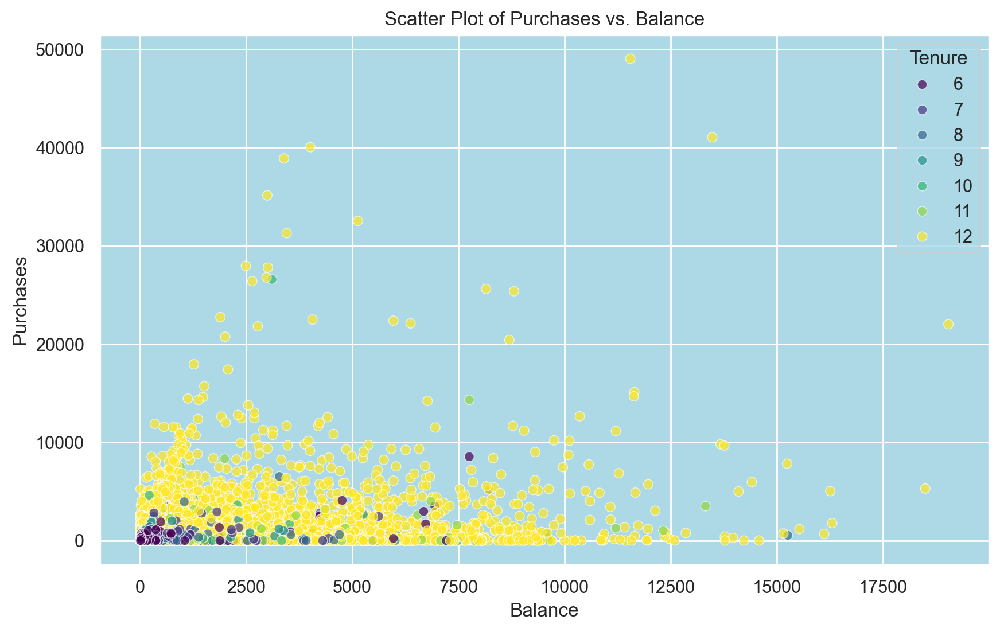

In [12]:
# Scatter plot for Purchases vs. Balance
plt.figure(figsize=(10, 6))
sns.scatterplot(x='BALANCE', y='PURCHASES', data=df, hue='TENURE', palette='viridis', alpha=0.7)
plt.title('Scatter Plot of Purchases vs. Balance')
plt.xlabel('Balance')
plt.ylabel('Purchases')
plt.legend(title='Tenure', loc='upper right')
plt.show()


The scatter plot shows a positive correlation between purchases and balance, with most data points clustered at lower balance and purchase values. Customers with higher tenures (12 months) tend to have a wider range of balances and purchases.

### This scatter plot will help us explore the relationship between the credit limit of customers and their payment amounts.

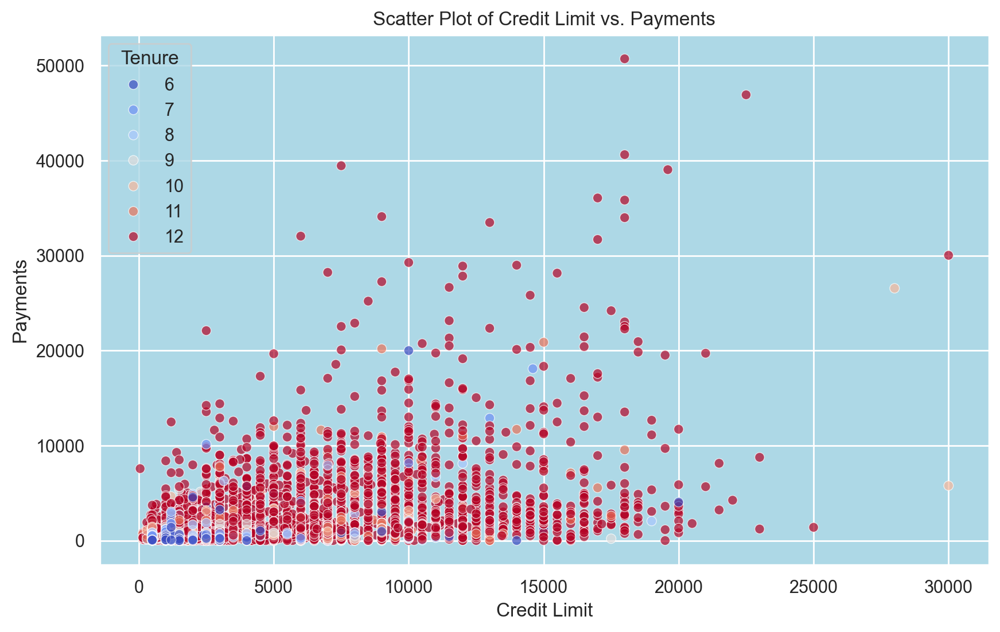

In [13]:
# Scatter plot for Credit Limit vs. Payments
plt.figure(figsize=(10, 6))
sns.scatterplot(x='CREDIT_LIMIT', y='PAYMENTS', data=df, hue='TENURE', palette='coolwarm', alpha=0.7)
plt.title('Scatter Plot of Credit Limit vs. Payments')
plt.xlabel('Credit Limit')
plt.ylabel('Payments')
plt.legend(title='Tenure', loc='upper left')
plt.show()


### A scatter plot showing the relationship between cash advances taken by customers and how frequently they take these advances.

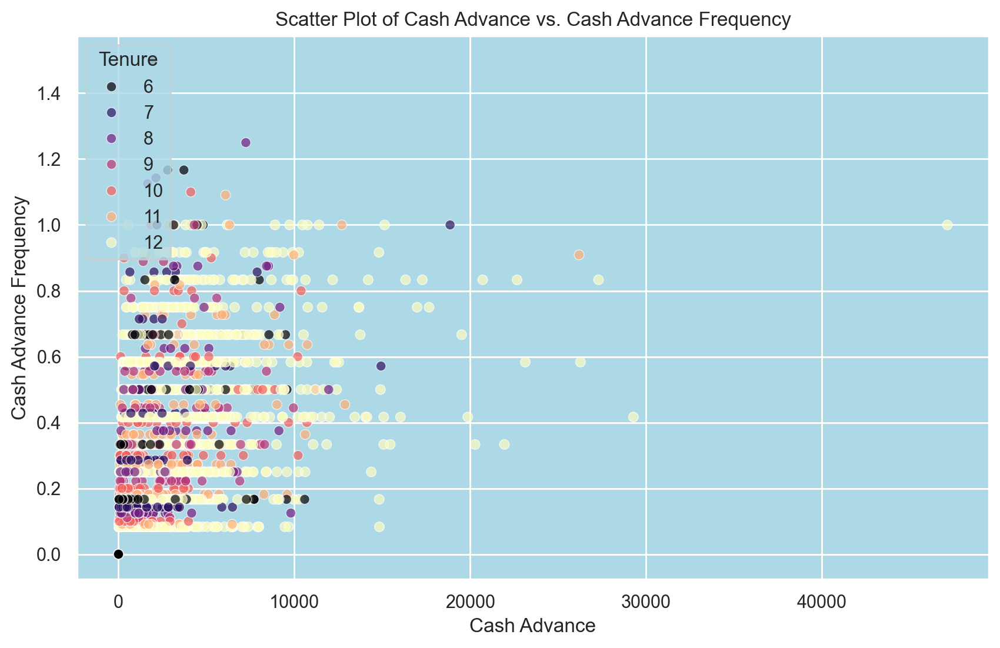

In [14]:
# Scatter plot for Cash Advance vs. Cash Advance Frequency
plt.figure(figsize=(10, 6))
sns.scatterplot(x='CASH_ADVANCE', y='CASH_ADVANCE_FREQUENCY', data=df, hue='TENURE', palette='magma', alpha=0.7)
plt.title('Scatter Plot of Cash Advance vs. Cash Advance Frequency')
plt.xlabel('Cash Advance')
plt.ylabel('Cash Advance Frequency')
plt.legend(title='Tenure', loc='upper left')
plt.show()


### Scatter Plots: Look for linear or non-linear relationships between variables. For example, a cluster of points might suggest a group of customers with similar behavior.
### KDE Plots: These plots on the diagonal show the distribution of each variable, helping identify skewness or multimodal distributions.
### Clusters or Patterns: Clusters in the scatter plots could indicate natural customer segments based on their financial behaviors.

<Figure size 2000x1600 with 0 Axes>

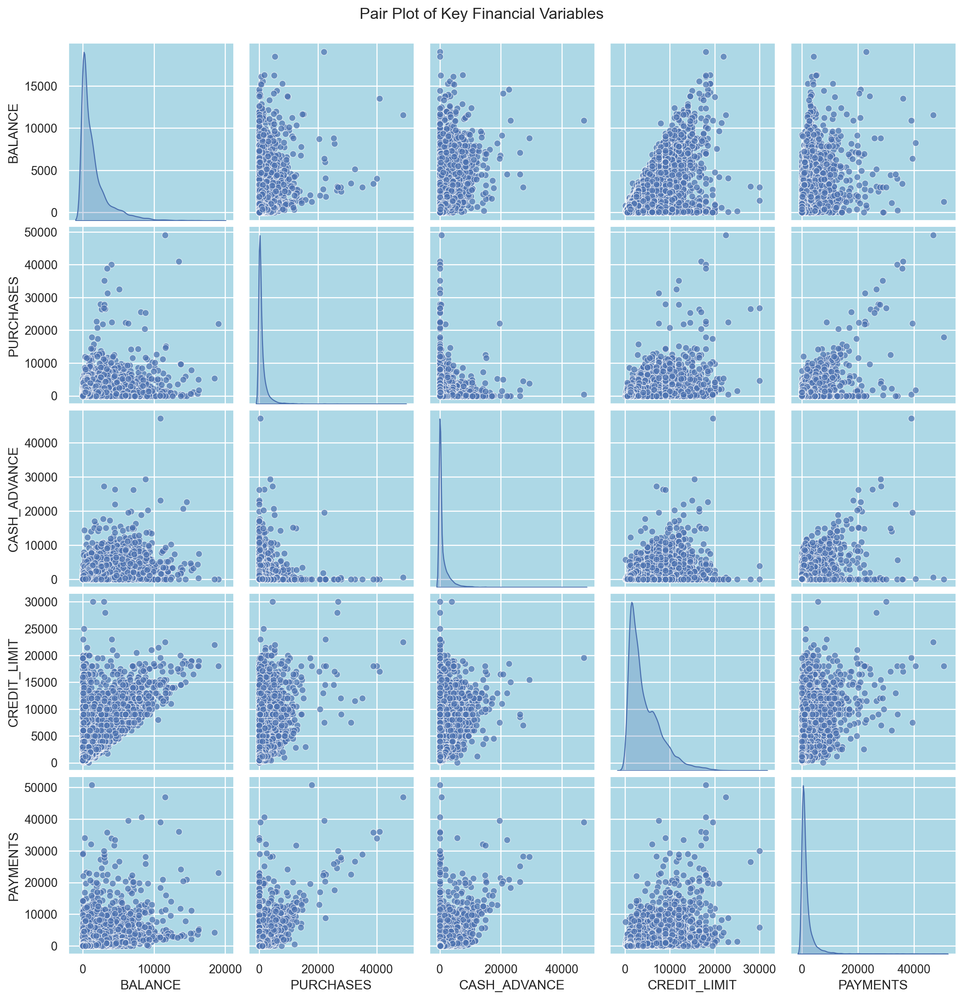

In [15]:
# Select a subset of columns to include in the pair plot
pairplot_columns = ['BALANCE', 'PURCHASES', 'CASH_ADVANCE', 'CREDIT_LIMIT', 'PAYMENTS']

# Create a pair plot with the selected columns
plt.figure(figsize=(10, 8))
sns.pairplot(df[pairplot_columns], diag_kind='kde', plot_kws={'alpha': 0.7})
plt.suptitle('Pair Plot of Key Financial Variables', y=1.02)
plt.show()


The pair plot illustrates relationships among key financial variables like balance, purchases, cash advance, credit limit, and payments. It reveals varying degrees of correlation, with notable clustering and skewness, indicating diverse spending and repayment behaviors among customers.

### By using this correlation heatmap, you can gain insights into the relationships between different financial behaviors in your dataset

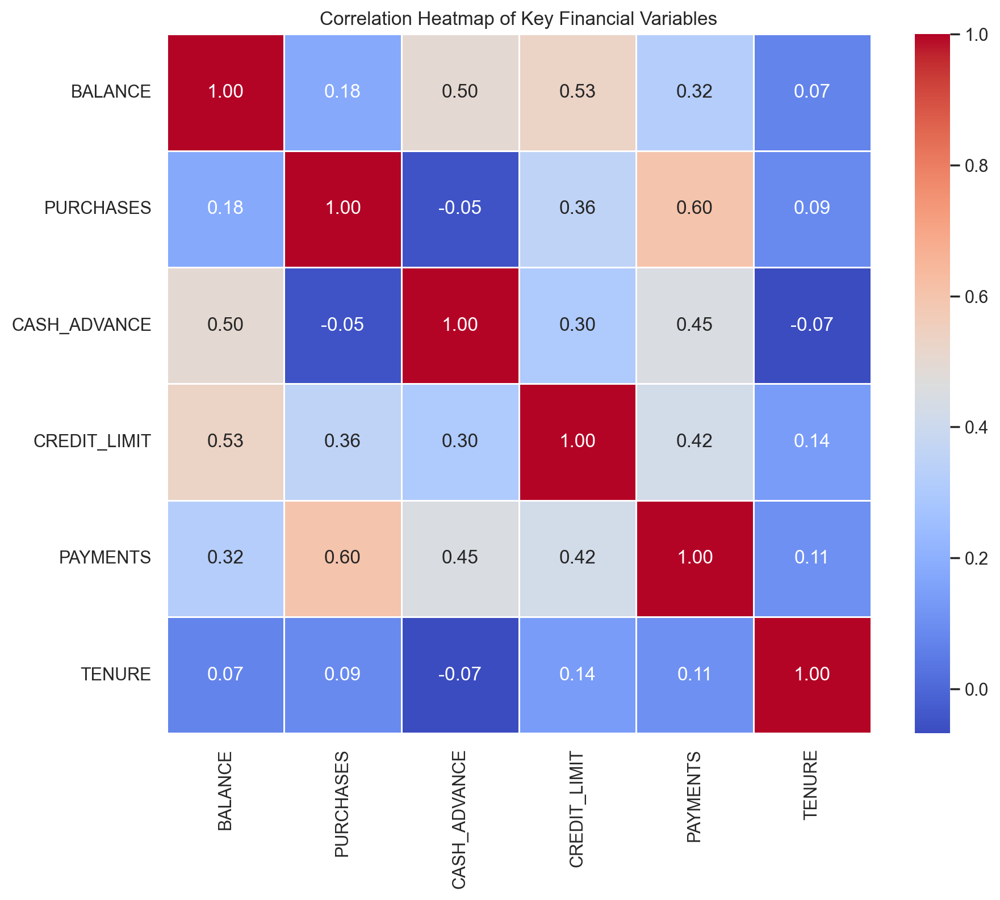

In [16]:
# Calculate the correlation matrix for numerical variables
correlation_matrix = df[['BALANCE', 'PURCHASES', 'CASH_ADVANCE', 'CREDIT_LIMIT', 'PAYMENTS', 'TENURE']].corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap of Key Financial Variables')
plt.show()


This heatmap visualizes the correlation between key financial variables in the credit card usage dataset. The strongest positive correlations are observed between *Balance* and *Cash Advance* (0.50) and *Balance* and *Credit Limit* (0.53), indicating that higher balances are associated with higher credit limits and more cash advances. There is also a notable correlation between *Payments* and *Purchases* (0.60), suggesting that customers who make higher payments tend to have more purchases.

### Here’s the code to create a joint plot for Balance and Purchases:

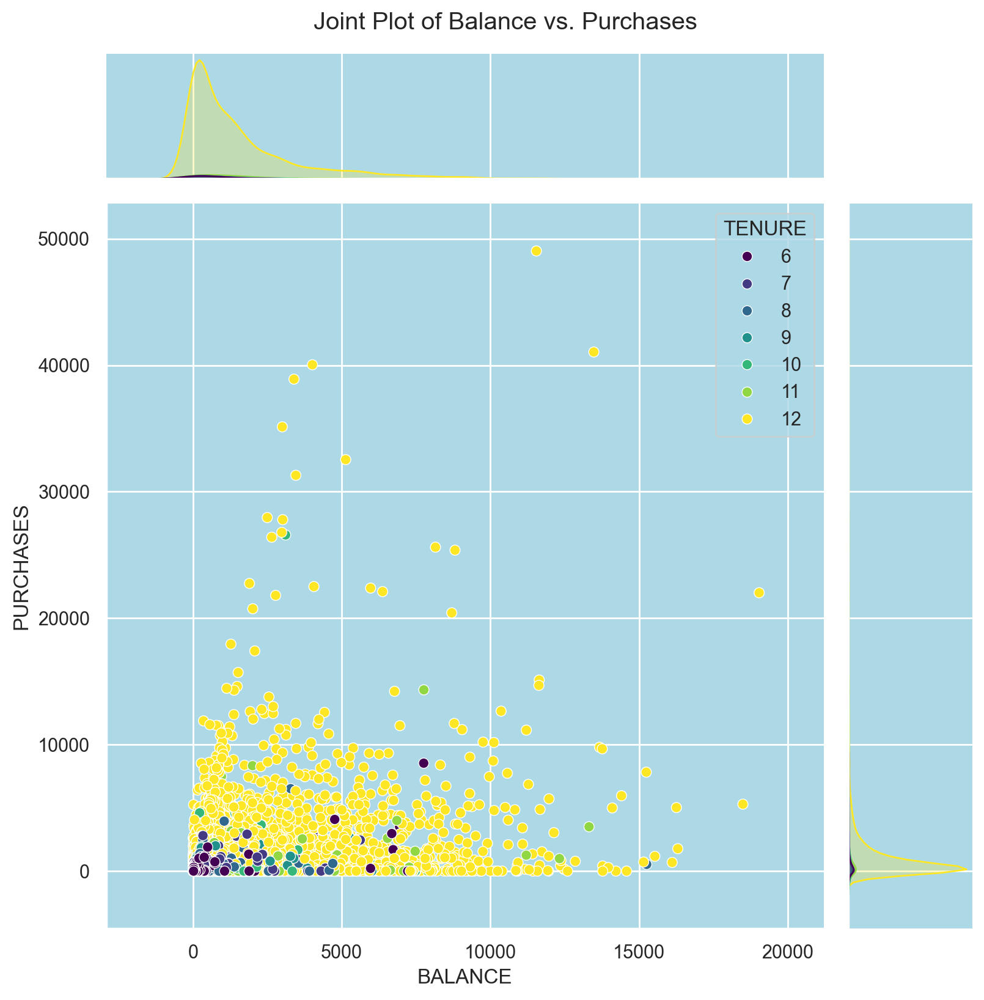

In [17]:
# Create a joint plot for Balance vs. Purchases
sns.jointplot(x='BALANCE', y='PURCHASES', data=df, kind='scatter', hue='TENURE', palette='viridis', height=8)
plt.suptitle('Joint Plot of Balance vs. Purchases', y=1.02)
plt.show()

### Shape and Spread: The width of each violin shows the distribution density of the BALANCE for each TENURE category. Wider sections represent a higher density of customers with those balances.
### Median and Quartiles: The white dot inside the violin represents the median, and the thick black bar in the center represents the interquartile range (IQR).
### Outliers and Variability: The plot also shows outliers as points outside the violins, and the overall shape indicates variability within each tenure group.

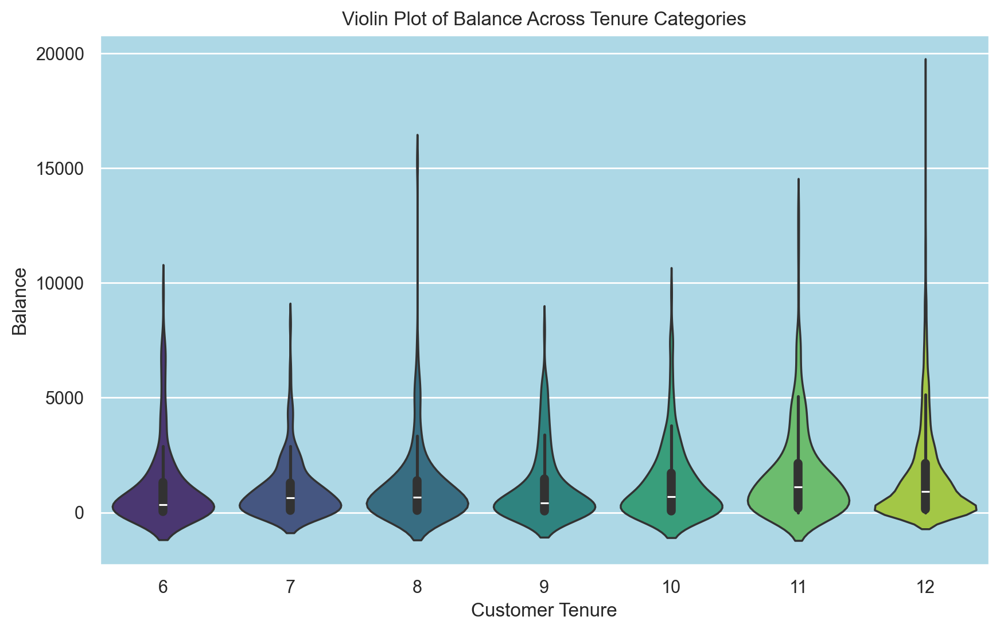

In [18]:
# Create a violin plot for Balance across different Tenure categories
plt.figure(figsize=(10, 6))
sns.violinplot(x='TENURE', y='BALANCE', data=df, palette='viridis')
plt.title('Violin Plot of Balance Across Tenure Categories')
plt.xlabel('Customer Tenure')
plt.ylabel('Balance')
plt.show()

<a id="preprocessing"> </a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:250%; text-align:center; border-radius:15px 50px; visibility:visible;">Step 5 | Data Preprocessing</h2>
⬆️ [Table of Contents](#contents_tabel)

<a id="missingvalue"></a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:150%; text-align:left; border-radius:15px 50px; visibility:visible;">Step 5.1 | Missing Value Treatment</h2>


In [19]:
# Handling Missing Values
# Filling missing value in 'CREDIT_LIMIT' with the mean of the column
df['CREDIT_LIMIT'] = df['CREDIT_LIMIT'].fillna(df['CREDIT_LIMIT'].mean())

In [20]:
# Filling missing values in 'MINIMUM_PAYMENTS' with the median of the column
df['MINIMUM_PAYMENTS'] = df['MINIMUM_PAYMENTS'].fillna(df['MINIMUM_PAYMENTS'].median())

In [21]:
# Display the updated dataset to confirm missing values have been handled
print("Missing values after handling:\n", df.isnull().sum())

Missing values after handling:
 CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64


<a id="outlier"> </a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:150%; text-align:left; border-radius:15px 50px; visibility:visible;">Step 5.2 | Outlier Treatment</h2>
⬆️ [Table of Contents](#contents_tabel)

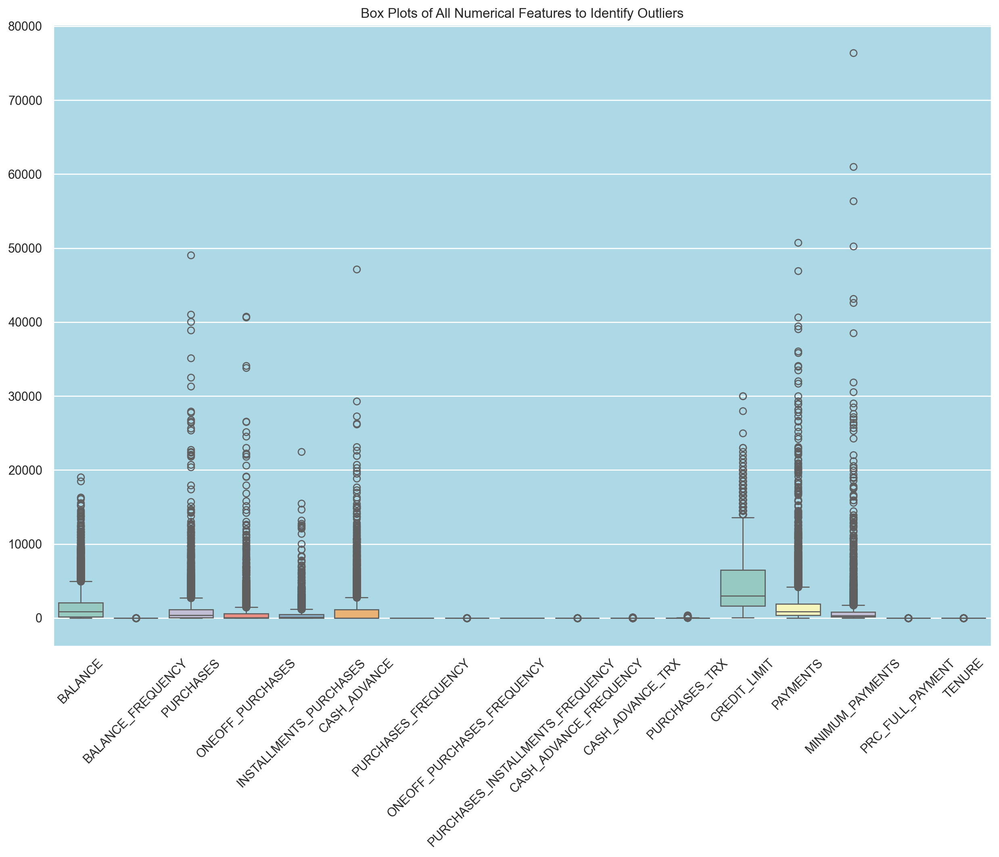

In [22]:
# Create box plots for all numerical features in the dataset
plt.figure(figsize=(15, 10))
sns.boxplot(data=df.select_dtypes(include='number'), palette='Set3')
plt.xticks(rotation=45)
plt.title('Box Plots of All Numerical Features to Identify Outliers')
plt.show()

In [23]:
continuous_features

['BALANCE',
 'BALANCE_FREQUENCY',
 'PURCHASES',
 'ONEOFF_PURCHASES',
 'INSTALLMENTS_PURCHASES',
 'CASH_ADVANCE',
 'PURCHASES_FREQUENCY',
 'ONEOFF_PURCHASES_FREQUENCY',
 'PURCHASES_INSTALLMENTS_FREQUENCY',
 'CASH_ADVANCE_FREQUENCY',
 'CASH_ADVANCE_TRX',
 'PURCHASES_TRX',
 'CREDIT_LIMIT',
 'PAYMENTS',
 'MINIMUM_PAYMENTS',
 'PRC_FULL_PAYMENT']

In [24]:
Q1 = df[continuous_features].quantile(0.25)
Q3 = df[continuous_features].quantile(0.75)
IQR = Q3 - Q1
outliers_count_specified = ((df[continuous_features] < (Q1 - 1.5 * IQR)) | (df[continuous_features] > (Q3 + 1.5 * IQR))).sum()

outliers_count_specified

BALANCE                              695
BALANCE_FREQUENCY                   1493
PURCHASES                            808
ONEOFF_PURCHASES                    1013
INSTALLMENTS_PURCHASES               867
CASH_ADVANCE                        1030
PURCHASES_FREQUENCY                    0
ONEOFF_PURCHASES_FREQUENCY           782
PURCHASES_INSTALLMENTS_FREQUENCY       0
CASH_ADVANCE_FREQUENCY               525
CASH_ADVANCE_TRX                     804
PURCHASES_TRX                        766
CREDIT_LIMIT                         248
PAYMENTS                             808
MINIMUM_PAYMENTS                     909
PRC_FULL_PAYMENT                    1474
dtype: int64

In [25]:
df.drop("CUST_ID",axis=1)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,312.343947,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,312.343947,0.000000,6
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


### 1. Impute with Median

In [26]:
df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,312.343947,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,312.343947,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [27]:
# Function to replace outliers with median
def replace_outliers_with_median(df):
    for column in df.columns:
        if df[column].dtype in ['int64', 'float64']:  # Apply only to numerical columns
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            
            # Replace outliers with median
            median = df[column].median()
            df[column] = df[column].apply(lambda x: median if x < lower_bound or x > upper_bound else x)
    
    return df

# Continuous features to be considered for outlier detection
continuous_features = df.select_dtypes(include=['int64', 'float64']).columns

# Loop until outliers count becomes zero
while True:
    # Calculate IQR and outliers count
    Q1 = df[continuous_features].quantile(0.25)
    Q3 = df[continuous_features].quantile(0.75)
    IQR = Q3 - Q1
    outliers_count_specified = ((df[continuous_features] < (Q1 - 1.5 * IQR)) | 
                                (df[continuous_features] > (Q3 + 1.5 * IQR))).sum()
    
    # Break the loop if no outliers are left
    if outliers_count_specified.sum() == 0:
        break
    
    # Apply the function to replace outliers with median
    df = replace_outliers_with_median(df)


In [28]:
Q1 = df[continuous_features].quantile(0.25)
Q3 = df[continuous_features].quantile(0.75)
IQR = Q3 - Q1
outliers_count_specified = ((df[continuous_features] < (Q1 - 1.5 * IQR)) | (df[continuous_features] > (Q3 + 1.5 * IQR))).sum()
outliers_count_specified

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

In [29]:
df.shape

(8950, 18)

In [30]:
#  df.to_excel('Customer_Segmentation_Cleaned.xlsx', index=False)
    
# Read the Excel file
df_cleaned = pd.read_excel('Customer_Segmentation_Cleaned2.xlsx')

In [31]:
# Print the first few rows of the DataFrame
df_cleaned.shape

(8950, 21)

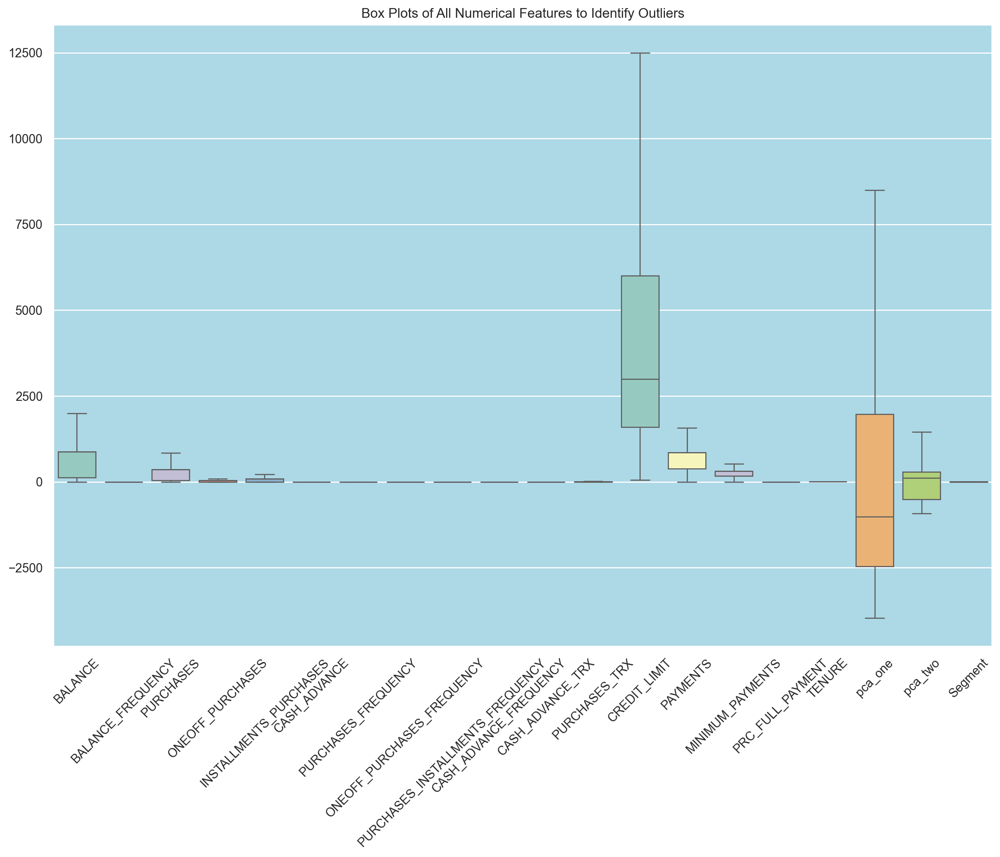

In [32]:
# Create box plots for all numerical features in the dataset
plt.figure(figsize=(15, 10))
sns.boxplot(data=df_cleaned.select_dtypes(include='number'), palette='Set3')
plt.xticks(rotation=45)
plt.title('Box Plots of All Numerical Features to Identify Outliers')
plt.show()

<a id="dataspliting"></a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:250%; text-align:center; border-radius:15px 50px; visibility:visible;">Data Spliting</h2>
⬆️ [Table of Contents](#contents_tabel)

In [33]:
df2 = pd.read_excel("Customer_Segmentation_Cleaned2.xlsx")

In [34]:
df2

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,...,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,pca_one,pca_two,Segment
0,C10001,40.900749,1,95.40000,0.0,95.4,0,0.166667,0.000000,0.083333,...,0,2,1000.0,201.802084,139.509787,0,12,-3052.562829,-652.205719,3
1,C10002,873.163945,1,0.00000,0.0,0.0,0,0.000000,0.000000,0.000000,...,0,0,7000.0,856.820966,312.343947,0,12,2978.404833,192.758901,1
2,C10003,873.099403,1,773.17000,38.0,0.0,0,1.000000,0.083333,0.000000,...,0,12,7500.0,622.066742,312.343947,0,12,3473.697217,97.830513,1
3,C10004,1666.670542,1,361.12250,38.0,0.0,0,0.083333,0.083333,0.000000,...,0,1,7500.0,0.000000,312.343947,0,12,3456.398062,766.481981,1
4,C10005,817.714335,1,16.00000,16.0,0.0,0,0.083333,0.083333,0.000000,...,0,1,1200.0,678.334763,244.791237,0,12,-2824.321402,209.541533,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1,291.12000,0.0,89.0,0,1.000000,0.000000,0.833333,...,0,6,1000.0,325.594462,48.886365,0,12,-3046.909589,-663.780135,3
8946,C19187,19.183215,1,300.00000,0.0,89.0,0,1.000000,0.000000,0.833333,...,0,6,1000.0,275.861322,312.343947,0,12,-3047.954062,-643.200315,3
8947,C19188,23.398673,1,144.40000,0.0,144.4,0,0.833333,0.000000,0.666667,...,0,5,1000.0,81.270775,82.418369,0,12,-3057.430001,-704.523850,3
8948,C19189,13.457564,1,0.00000,0.0,0.0,0,0.000000,0.000000,0.000000,...,0,0,500.0,52.549959,55.755628,0,12,-3559.303918,-703.522865,3


In [35]:
# Dimensionality Reduction for visualization
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df2.drop(['CUST_ID'], axis=1))  # Adjust the dropped columns based on relevance
df2['pca_one'] = pca_result[:,0]
df2['pca_two'] = pca_result[:,1]

# Step 2: Apply K-Means Clustering
kmeans = KMeans(n_clusters=4, random_state=42)  # Adjust number of clusters based on your analysis
df2['Segment'] = kmeans.fit_predict(df2.drop(['CUST_ID', 'pca_one', 'pca_two'], axis=1))

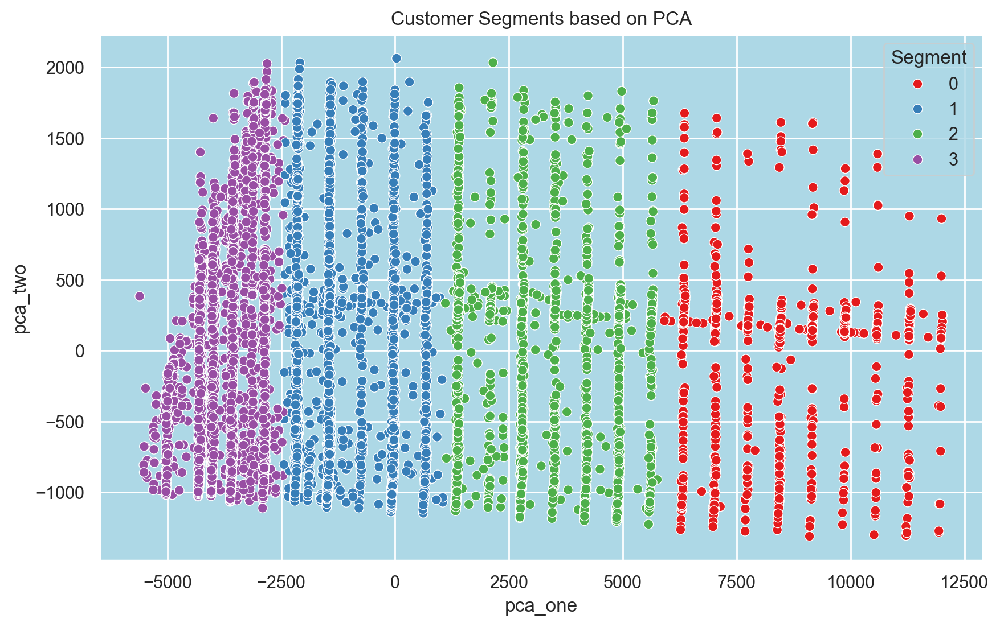

In [36]:
# Step 3: Visualize Clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='pca_one', y='pca_two', hue='Segment', data=df2, palette='Set1')
plt.title('Customer Segments based on PCA')
plt.show()

The scatter plot visualizes customer segments using PCA (Principal Component Analysis), where data points are plotted on two principal components (pca_one and pca_two). Each color represents a different cluster, with four clusters (0, 1, 2, 3) differentiated by distinct patterns, demonstrating how customers are grouped based on their financial behaviors.



In [37]:
# Use Cluster labels as the target variable to understand key features driving segmentation
X = df2.drop(['CUST_ID', 'Segment','pca_one','pca_two'], axis=1)  # Exclude Cluster label , customer ID , pcs_one and pcs_two 
y = df2['Segment']  # Target is the cluster label

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

<a id="decisiontree"> </a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:250%; text-align:center; border-radius:15px 50px; visibility:visible;">Step 6 | Decision Tree Model Building</h2>
⬆️ [Table of Contents](#contents_tabel)

In [38]:
# Initialize the Decision Tree Classifier
dt = DecisionTreeClassifier(random_state=42)
dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [39]:
# Predict on the test data
y_pred = dt.predict(X_test)

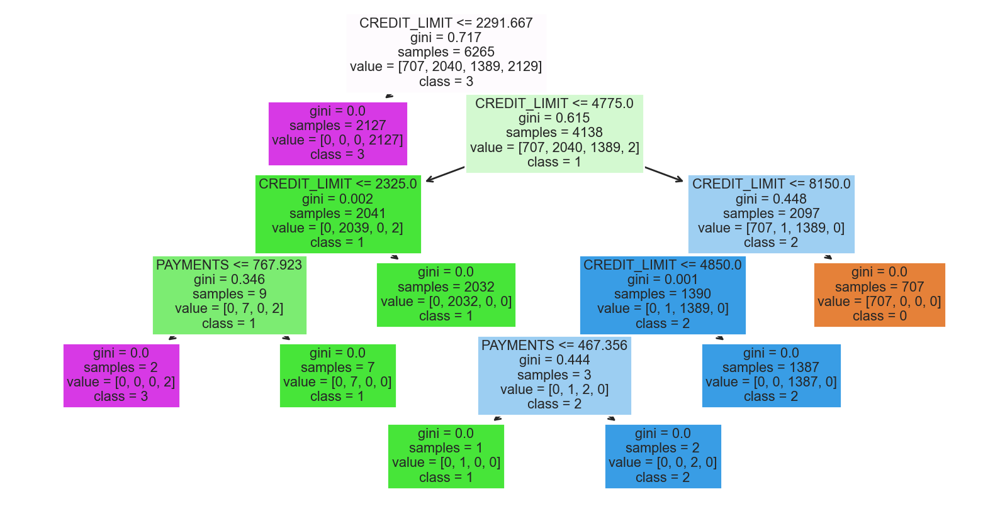

In [40]:
# Visualize the Decision Tree (Optional)
from sklearn import tree
plt.figure(figsize=(10,5))
tree.plot_tree(dt, filled=True, feature_names=X.columns, class_names=[str(i) for i in set(y)])
plt.show()

<a id="dthyperparameter"> </a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:150%; text-align:left; border-radius:15px 50px; visibility:visible;"> DT  Hyperparameter Tuning </h2>
⬆️ [Table of Contents](#contents_tabel)

In [41]:
# gini: Reduce the impurity score from the root node.
# entropy: Measures randomness in the information being processed, it uses log method which makes it more complex.
# bootstrap: sampling method that randomly select samples from dataset with replacement. 
# Define the parameter grid to search

param_grid = {
    'max_depth': [None, 5, 10, 15, 20, 25, 30,35],
    'min_samples_split': [2, 5, 10, 15, 20,25],
    'min_samples_leaf': [1, 2, 5, 10,15],
    'criterion': ['gini', 'entropy']
}

# Start the timer
start_time = time.time()

# Initialize GridSearchCV with your existing Decision Tree model
grid_search = GridSearchCV(estimator=dt, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=2)

# Fit GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# End the timer
end_time = time.time()

# Calculate the elapsed time
dt_time = end_time - start_time

# Print the elapsed time
print(f"Time taken to run the code: {dt_time:.2f} seconds")


Fitting 5 folds for each of 480 candidates, totalling 2400 fits
Time taken to run the code: 18.49 seconds


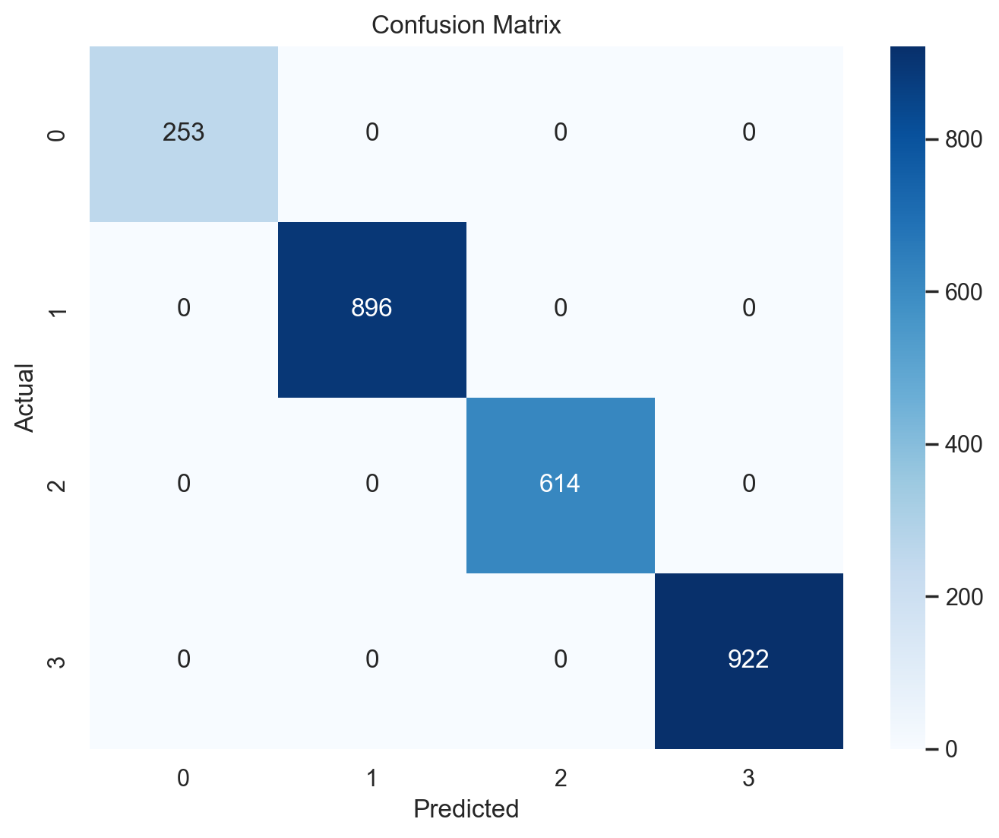

In [42]:

# Compute the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=dt.classes_, yticklabels=dt.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


In [43]:
# Generate the classification report
report = classification_report(y_test, y_pred, output_dict=True)

# Convert the classification report to a pandas DataFrame
report_df = pd.DataFrame(report).transpose()

# Display the DataFrame
print("Classification Report in Tabular Format:")
print(report_df)


Classification Report in Tabular Format:
              precision  recall  f1-score  support
0                   1.0     1.0       1.0    253.0
1                   1.0     1.0       1.0    896.0
2                   1.0     1.0       1.0    614.0
3                   1.0     1.0       1.0    922.0
accuracy            1.0     1.0       1.0      1.0
macro avg           1.0     1.0       1.0   2685.0
weighted avg        1.0     1.0       1.0   2685.0


In [44]:
# Get the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Get the best model from grid search
best_dt_model = grid_search.best_estimator_

# Predict on the test set using the best model
y_pred_best = best_dt_model.predict(X_test)

# Evaluate the best model
print("Accuracy of Best Decision Tree Model after Hyperparameter Tuning: {:.2f}%".format(accuracy_score(y_test, y_pred_best) * 100))


Best Hyperparameters: {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 5, 'min_samples_split': 2}
Accuracy of Best Decision Tree Model after Hyperparameter Tuning: 99.85%


<a id="random"></a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:250%; text-align:center; border-radius:15px 50px; visibility:visible;">Step 7 | Rendom Forest Model Building</h2>
⬆️ [Table of Contents](#contents_tabel)

In [45]:
# Initialize the Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf_model.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

In [46]:
# Predict on the test set
y_pred = rf_model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Random Forest Model Accuracy: {accuracy * 100:.2f}%')


Random Forest Model Accuracy: 99.85%


<a id="rfhyperparameter"> </a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:150%; text-align:left; border-radius:15px 50px; visibility:visible;">RF Hyperparameter Tuning </h2>
⬆️ [Table of Contents](#contents_tabel)

In [47]:
# Define the parameter grid to search
param_grid = {
    'n_estimators': [50, 100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20, 30],  # Maximum depth of each tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],  # Minimum number of samples required to be at a leaf node
    'max_features': ['auto', 'sqrt', 'log2'],  # Number of features to consider when looking for the best split
    'criterion': ['gini', 'entropy']  # Function to measure the quality of a split
}


In [48]:
# Start the timer
start_time = time.time()

# Initialize the Random Forest Classifier with your existing model setup
rf_model = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV with the Random Forest Classifier
grid_search_rf = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=2)

# Fit GridSearchCV to the training data
grid_search_rf.fit(X_train, y_train)

# End the timer
end_time = time.time()

# Calculate the elapsed time
elapsed_time = end_time - start_time

# Print the elapsed time
print(f"Time taken to run the code: {elapsed_time:.2f} seconds")

Fitting 5 folds for each of 864 candidates, totalling 4320 fits
Time taken to run the code: 1087.71 seconds


In [49]:
# Get the best hyperparameters
best_params_rf = grid_search_rf.best_params_
print("Best Hyperparameters for Random Forest:", best_params_rf)

# Get the best model from grid search
best_rf_model = grid_search_rf.best_estimator_

# Predict on the test set using the best model
y_pred_best_rf = best_rf_model.predict(X_test)

# Evaluate the best model
best_accuracy_rf = accuracy_score(y_test, y_pred_best_rf)
print(f'Accuracy of Best Random Forest Model after Hyperparameter Tuning: {best_accuracy_rf * 100:.2f}%')

Best Hyperparameters for Random Forest: {'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 200}
Accuracy of Best Random Forest Model after Hyperparameter Tuning: 99.89%


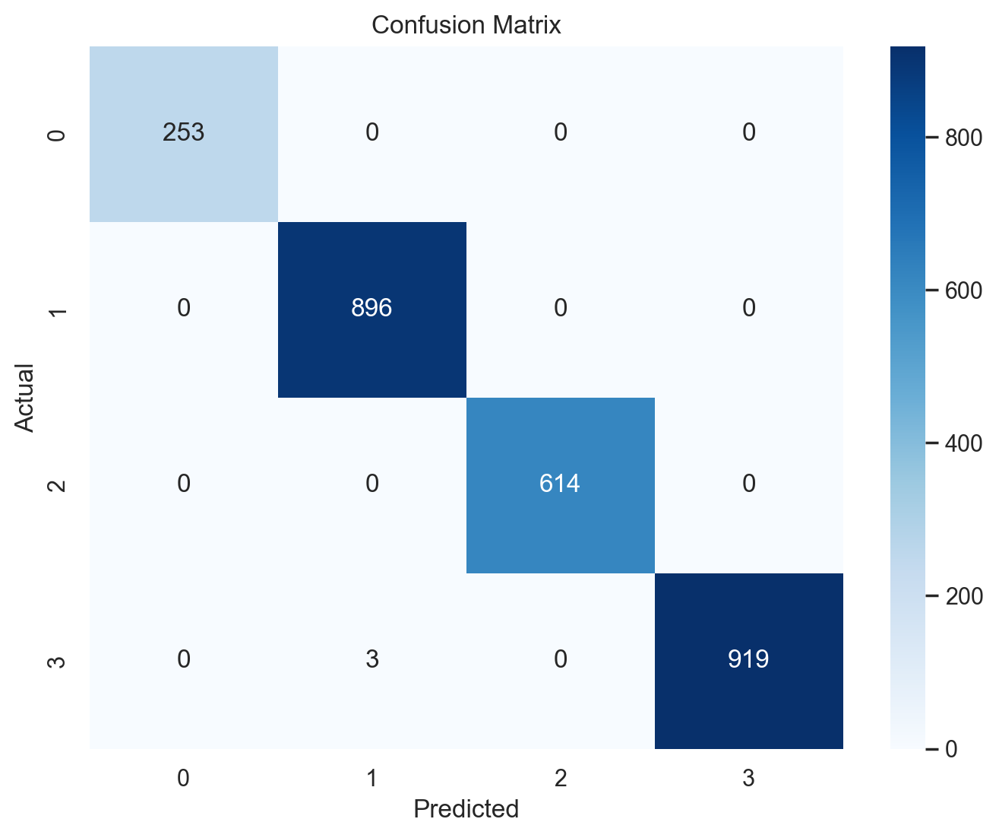

In [50]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_best_rf)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=best_rf_model.classes_, yticklabels=best_rf_model.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [51]:
# Classification Report
classification_report_dict = classification_report(y_test, y_pred_best_rf, output_dict=True)
classification_report_df = pd.DataFrame(classification_report_dict).transpose()
print("Classification Report (Tabular Format):\n", classification_report_df)

Classification Report (Tabular Format):
               precision    recall  f1-score      support
0              1.000000  1.000000  1.000000   253.000000
1              0.996663  1.000000  0.998329   896.000000
2              1.000000  1.000000  1.000000   614.000000
3              1.000000  0.996746  0.998370   922.000000
accuracy       0.998883  0.998883  0.998883     0.998883
macro avg      0.999166  0.999187  0.999175  2685.000000
weighted avg   0.998886  0.998883  0.998883  2685.000000


<a id="logistic"> </a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:250%; text-align:center; border-radius:15px 50px; visibility:visible;">Step 8 | Logistic Regression Model Building</h2>
⬆️ [Table of Contents](#contents_tabel)

In [52]:
# Initialize the pipeline with data standardization and logistic regression
logistic_pipeline = make_pipeline(StandardScaler(), LogisticRegression(random_state=42))

# Train the logistic regression model
logistic_pipeline.fit(X_train, y_train)

# Predict on the test set
y_pred_logistic = logistic_pipeline.predict(X_test)

# Evaluate the model
accuracy_logistic = accuracy_score(y_test, y_pred_logistic)
print(f'Logistic Regression Model Accuracy: {accuracy_logistic * 100:.2f}%')


Logistic Regression Model Accuracy: 99.78%


<a id="logistictuning"></a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:150%; text-align:left; border-radius:15px 50px; visibility:visible;">Logistic Regression Hyperparameter Tuning </h2>
⬆️ [Table of Contents](#contents_tabel)

In [53]:
# penalty - determines the regularization, and helps prevent overfitting by adding a penalty to the optimization objective.
# 'l1' refers to Lasso regularization, and 'l2' refers to Ridge regularization
# 'C' - inverse of the regularization strength, smaller values specify stronger regularization
# Define the pipeline with logistic regression
logistic_pipeline = make_pipeline(StandardScaler(), LogisticRegression(random_state=42))

# Define the hyperparameter grid for logistic regression
param_grid = {
    'logisticregression__C': [0.01, 0.1, 1, 10, 100],   # Regularization strength
    'logisticregression__penalty': ['l1', 'l2', 'elasticnet'],  # Penalty terms
    'logisticregression__solver': ['liblinear', 'saga'], # Solvers
}

# Start the timer
start_time = time.time()

# Initialize Grid Search with Cross-Validation
grid_search_logistic = GridSearchCV(logistic_pipeline, param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=2)

# Fit the model to the training data
grid_search_logistic.fit(X_train, y_train)

# Best parameters and accuracy
print(f'Best Parameters: {grid_search_logistic.best_params_}')
print(f'Best Cross-Validation Accuracy: {grid_search_logistic.best_score_ * 100:.2f}%')

# Predict on the test set with the best estimator
best_logistic_model = grid_search_logistic.best_estimator_
y_pred_logistic = best_logistic_model.predict(X_test)

# End the timer
end_time = time.time()

# Calculate the elapsed time
lr_time = end_time - start_time

# Print the elapsed time
print(f"Time taken to run the code: {lr_time:.2f} seconds")

# Calculate test set accuracy
accuracy_logistic = accuracy_score(y_test, y_pred_logistic)
print(f'Logistic Regression Model Test Accuracy: {accuracy_logistic * 100:.2f}%')

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best Parameters: {'logisticregression__C': 10, 'logisticregression__penalty': 'l1', 'logisticregression__solver': 'saga'}
Best Cross-Validation Accuracy: 99.87%
Time taken to run the code: 8.21 seconds
Logistic Regression Model Test Accuracy: 99.81%


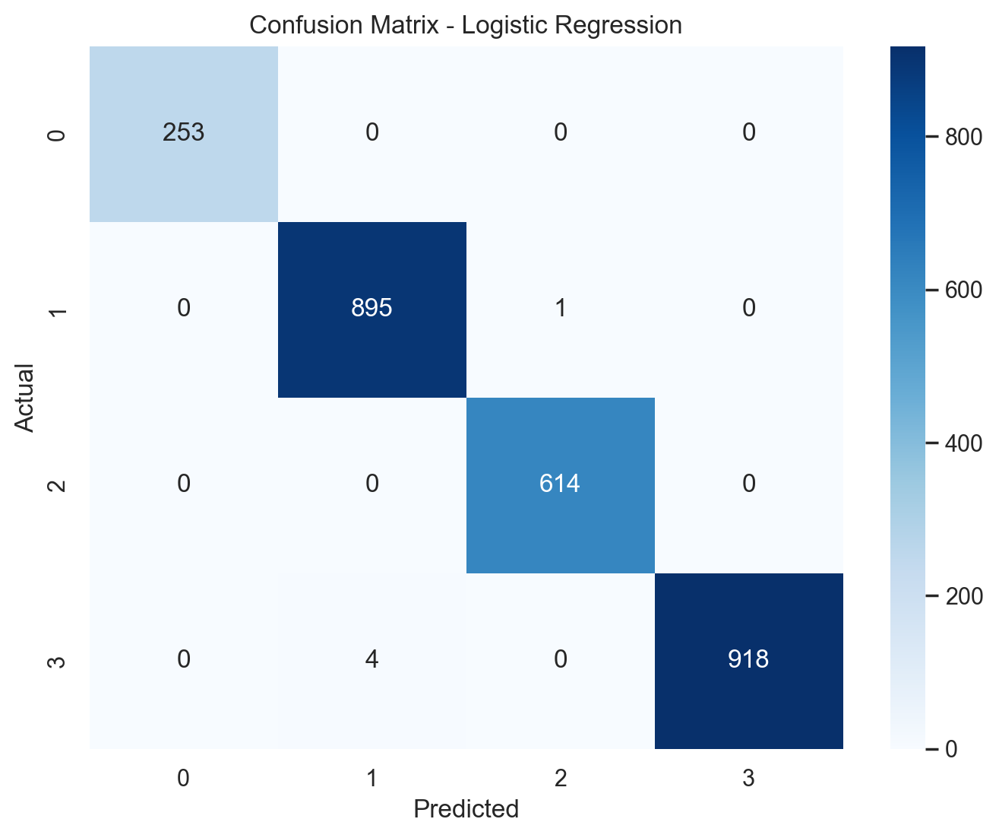

In [54]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_logistic)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=best_logistic_model.classes_, yticklabels=best_logistic_model.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Logistic Regression')
plt.show()

In [55]:
# Classification Report in Tabular Format
classification_report_dict = classification_report(y_test, y_pred_logistic, output_dict=True)
classification_report_df = pd.DataFrame(classification_report_dict).transpose()
print("\nClassification Report (Tabular Format):\n", classification_report_df)


Classification Report (Tabular Format):
               precision    recall  f1-score      support
0              1.000000  1.000000  1.000000   253.000000
1              0.995551  0.998884  0.997214   896.000000
2              0.998374  1.000000  0.999186   614.000000
3              1.000000  0.995662  0.997826   922.000000
accuracy       0.998138  0.998138  0.998138     0.998138
macro avg      0.998481  0.998636  0.998557  2685.000000
weighted avg   0.998143  0.998138  0.998138  2685.000000


<a id="svc"> </a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:250%; text-align:center; border-radius:15px 50px; visibility:visible;">Step 9 | Support Vector Machine (SVM) Model Building</h2>
⬆️ [Table of Contents](#contents_tabel)

In [56]:
# Pipeline(): Sequence of steps that manage the flow of data.(Pre-processing, feature extraction, model fitting and validation)
# StandardScaler(): Used for Standardizing features by removing the mean and scaling to unit variance.
# Standardize the features and initialize the SVM classifier with RBF kernel
svm_model = make_pipeline(StandardScaler(), SVC(kernel='rbf', random_state=42))

# Train the model
svm_model.fit(X_train, y_train)


Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc', SVC(random_state=42))])

In [57]:
# Predict on the test set
y_pred_svm = svm_model.predict(X_test)

# Calculate accuracy
accuracy_svm = accuracy_score(y_test, y_pred_svm)
print(f'SVM Model Accuracy: {accuracy_svm * 100:.2f}%')


SVM Model Accuracy: 97.65%


<a id="svmhyperparameter"> </a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:150%; text-align:left; border-radius:15px 50px; visibility:visible;">SVM Hyperparameter Tuning </h2>
⬆️ [Table of Contents](#contents_tabel)⬆

In [58]:
# Define the pipeline
svm_pipeline = make_pipeline(StandardScaler(), SVC(kernel='rbf', random_state=42))

# Define the hyperparameter grid
param_grid = {
    'svc__C': [0.1, 1, 10, 100],        # Regularization parameter
    'svc__gamma': [0.001, 0.01, 0.1, 1] # Kernel coefficient
}

# Start the timer
start_time = time.time()

# Initialize Grid Search with Cross-Validation
grid_search = GridSearchCV(svm_pipeline, param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=2)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Best parameters and accuracy
print(f'Best Parameters: {grid_search.best_params_}')
print(f'Best Cross-Validation Accuracy: {grid_search.best_score_ * 100:.2f}%')

# Predict on the test set with the best estimator
best_svm_model = grid_search.best_estimator_
y_pred_svm = best_svm_model.predict(X_test)

# End the timer
end_time = time.time()

# Calculate the elapsed time
svm_time = end_time - start_time

# Print the elapsed time
print(f"Time taken to run the code: {svm_time:.2f} seconds")

# Calculate test set accuracy
accuracy_svm = accuracy_score(y_test, y_pred_svm)
print(f'SVM Model Test Accuracy: {accuracy_svm * 100:.2f}%')

Fitting 5 folds for each of 16 candidates, totalling 80 fits
Best Parameters: {'svc__C': 100, 'svc__gamma': 0.01}
Best Cross-Validation Accuracy: 99.89%
Time taken to run the code: 36.95 seconds
SVM Model Test Accuracy: 99.70%


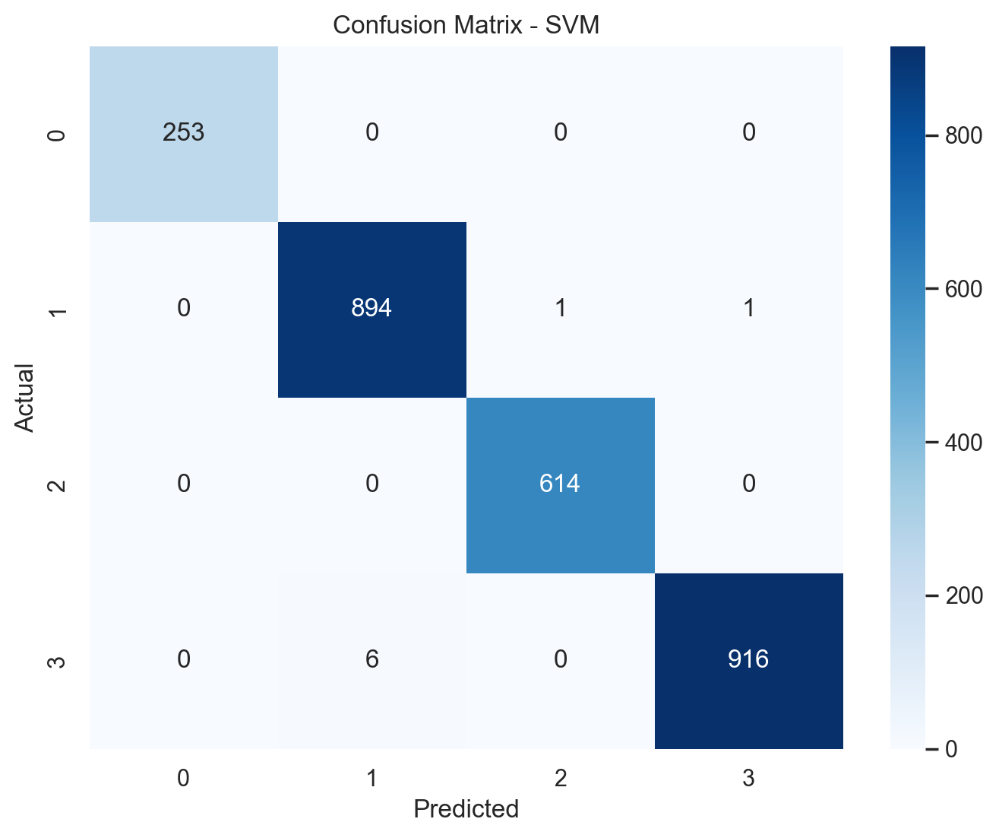

In [59]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_svm)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=best_svm_model.classes_, yticklabels=best_svm_model.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - SVM')
plt.show()

In [60]:
# Classification Report in Tabular Format
classification_report_dict = classification_report(y_test, y_pred_svm, output_dict=True)
classification_report_df = pd.DataFrame(classification_report_dict).transpose()
print("\nClassification Report (Tabular Format):\n", classification_report_df)


Classification Report (Tabular Format):
               precision    recall  f1-score     support
0              1.000000  1.000000  1.000000   253.00000
1              0.993333  0.997768  0.995546   896.00000
2              0.998374  1.000000  0.999186   614.00000
3              0.998909  0.993492  0.996194   922.00000
accuracy       0.997020  0.997020  0.997020     0.99702
macro avg      0.997654  0.997815  0.997731  2685.00000
weighted avg   0.997029  0.997020  0.997020  2685.00000


<a id="knn"> </a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:250%; text-align:center; border-radius:15px 50px; visibility:visible;">Step 10 | K-Nearest Neighbors (KNN) Model Building</h2>
⬆️ [Table of Contents](#contents_tabel)

In [61]:
# Initialize the K-Nearest Neighbors Classifier
knn_model = KNeighborsClassifier(n_neighbors=5)  # You can choose the number of neighbors

# Train the model
knn_model.fit(X_train, y_train)


KNeighborsClassifier()

In [62]:
# Predict on the test set
y_pred_knn = knn_model.predict(X_test)

# Calculate accuracy
accuracy_knn = accuracy_score(y_test, y_pred_knn)
print(f'KNN Model Accuracy: {accuracy_knn * 100:.2f}%')


KNN Model Accuracy: 99.78%


<a id="knntuning"> </a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:150%; text-align:left; border-radius:15px 50px; visibility:visible;">KNN Hyperparameter Tuning </h2>
⬆️ [Table of Contents](#contents_tabel)

In [63]:
# Define the KNN model
knn_model = KNeighborsClassifier()

# Define the hyperparameter grid
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],       # Number of neighbors
    'weights': ['uniform', 'distance'],    # Uniform or distance-based weighting
    'p': [1, 2]                            # Power parameter (1: Manhattan, 2: Euclidean)
}

# Start the timer
start_time = time.time()

# Initialize Grid Search with Cross-Validation
grid_search_knn = GridSearchCV(knn_model, param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=2)

# Fit the model to the training data
grid_search_knn.fit(X_train, y_train)

# Best parameters and accuracy
print(f'Best Parameters: {grid_search_knn.best_params_}')
print(f'Best Cross-Validation Accuracy: {grid_search_knn.best_score_ * 100:.2f}%')

# Predict on the test set with the best estimator
best_knn_model = grid_search_knn.best_estimator_
y_pred_knn = best_knn_model.predict(X_test)

# End the timer
end_time = time.time()

# Calculate the elapsed time
knn_time = end_time - start_time

# Print the elapsed time
print(f"Time taken to run the code: {knn_time:.2f} seconds")

# Calculate test set accuracy
accuracy_knn = accuracy_score(y_test, y_pred_knn)
print(f'KNN Model Test Accuracy: {accuracy_knn * 100:.2f}%')

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best Parameters: {'n_neighbors': 9, 'p': 1, 'weights': 'uniform'}
Best Cross-Validation Accuracy: 99.86%
Time taken to run the code: 5.23 seconds
KNN Model Test Accuracy: 99.63%


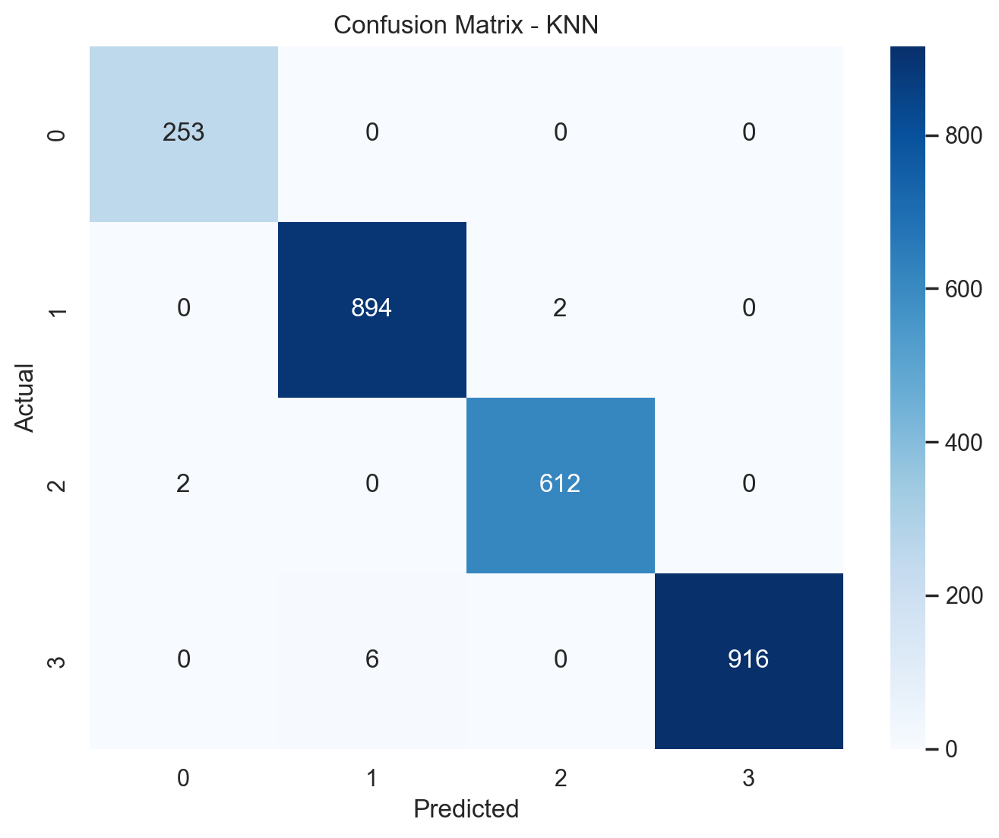

In [64]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_knn)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=best_knn_model.classes_, yticklabels=best_knn_model.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - KNN')
plt.show()

In [65]:
# Classification Report in Tabular Format
classification_report_dict = classification_report(y_test, y_pred_knn, output_dict=True)
classification_report_df = pd.DataFrame(classification_report_dict).transpose()
print("\nClassification Report (Tabular Format):\n", classification_report_df)


Classification Report (Tabular Format):
               precision    recall  f1-score      support
0              0.992157  1.000000  0.996063   253.000000
1              0.993333  0.997768  0.995546   896.000000
2              0.996743  0.996743  0.996743   614.000000
3              1.000000  0.993492  0.996736   922.000000
accuracy       0.996276  0.996276  0.996276     0.996276
macro avg      0.995558  0.997001  0.996272  2685.000000
weighted avg   0.996291  0.996276  0.996277  2685.000000


⬆️ [Table of Contents](#contents_tabel)

<a id="mandc"></a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:250%; text-align:center; border-radius:15px 50px; visibility:visible;">Step 11 | Model Evaluation & Conclusion</h2>

In [66]:
# Decision Tree Classification Report
dt_report = classification_report(y_test, y_pred, output_dict=True)
dt_evaluation = pd.DataFrame(dt_report).transpose()

# Random Forest Classification Report
rf_report = classification_report(y_test, y_pred_best_rf, output_dict=True)
rf_evaluation = pd.DataFrame(rf_report).transpose()

# Logistic Regression Classification Report
logistic_report = classification_report(y_test, y_pred_logistic, output_dict=True)
logistic_evaluation = pd.DataFrame(logistic_report).transpose()

# SVM Classification Report
svm_report = classification_report(y_test, y_pred_svm, output_dict=True)
svm_evaluation = pd.DataFrame(svm_report).transpose()

# KNN Classification Report
knn_report = classification_report(y_test, y_pred_knn, output_dict=True)
knn_evaluation = pd.DataFrame(knn_report).transpose()

# Define the evaluation DataFrames with the model names as a column
dt_evaluation['Model'] = 'Decision Tree'
rf_evaluation['Model'] = 'Random Forest'
logistic_evaluation['Model'] = 'Logistic Regression'
svm_evaluation['Model'] = 'SVM'
knn_evaluation['Model'] = 'KNN'

# Combine all evaluation DataFrames into one
all_evaluations = [dt_evaluation, rf_evaluation, logistic_evaluation, svm_evaluation, knn_evaluation]
results = pd.concat(all_evaluations).reset_index()

# Rename the index column to something meaningful (like 'Metric')
results = results.rename(columns={'index': 'Metric'})

# Reorganize columns for better readability
results = results[['Model', 'Metric', 'precision', 'recall', 'f1-score', 'support']]

# Sort the results by Model name and Metric if needed (optional)
results_sorted = results.sort_values(by=['Model', 'Metric'], ascending=[True, True])

# Display the formatted and sorted results as a Markdown table
print("Formatted Combined Model Evaluation Results:")
display(Markdown(results_sorted.to_markdown(index=False)))

Formatted Combined Model Evaluation Results:


| Model               | Metric       |   precision |   recall |   f1-score |     support |
|:--------------------|:-------------|------------:|---------:|-----------:|------------:|
| Decision Tree       | 0            |    1        | 0.996047 |   0.99802  |  253        |
| Decision Tree       | 1            |    0.996663 | 1        |   0.998329 |  896        |
| Decision Tree       | 2            |    0.998374 | 1        |   0.999186 |  614        |
| Decision Tree       | 3            |    1        | 0.996746 |   0.99837  |  922        |
| Decision Tree       | accuracy     |    0.99851  | 0.99851  |   0.99851  |    0.99851  |
| Decision Tree       | macro avg    |    0.998759 | 0.998198 |   0.998476 | 2685        |
| Decision Tree       | weighted avg |    0.998515 | 0.99851  |   0.99851  | 2685        |
| KNN                 | 0            |    0.992157 | 1        |   0.996063 |  253        |
| KNN                 | 1            |    0.993333 | 0.997768 |   0.995546 |  896        |
| KNN                 | 2            |    0.996743 | 0.996743 |   0.996743 |  614        |
| KNN                 | 3            |    1        | 0.993492 |   0.996736 |  922        |
| KNN                 | accuracy     |    0.996276 | 0.996276 |   0.996276 |    0.996276 |
| KNN                 | macro avg    |    0.995558 | 0.997001 |   0.996272 | 2685        |
| KNN                 | weighted avg |    0.996291 | 0.996276 |   0.996277 | 2685        |
| Logistic Regression | 0            |    1        | 1        |   1        |  253        |
| Logistic Regression | 1            |    0.995551 | 0.998884 |   0.997214 |  896        |
| Logistic Regression | 2            |    0.998374 | 1        |   0.999186 |  614        |
| Logistic Regression | 3            |    1        | 0.995662 |   0.997826 |  922        |
| Logistic Regression | accuracy     |    0.998138 | 0.998138 |   0.998138 |    0.998138 |
| Logistic Regression | macro avg    |    0.998481 | 0.998636 |   0.998557 | 2685        |
| Logistic Regression | weighted avg |    0.998143 | 0.998138 |   0.998138 | 2685        |
| Random Forest       | 0            |    1        | 1        |   1        |  253        |
| Random Forest       | 1            |    0.996663 | 1        |   0.998329 |  896        |
| Random Forest       | 2            |    1        | 1        |   1        |  614        |
| Random Forest       | 3            |    1        | 0.996746 |   0.99837  |  922        |
| Random Forest       | accuracy     |    0.998883 | 0.998883 |   0.998883 |    0.998883 |
| Random Forest       | macro avg    |    0.999166 | 0.999187 |   0.999175 | 2685        |
| Random Forest       | weighted avg |    0.998886 | 0.998883 |   0.998883 | 2685        |
| SVM                 | 0            |    1        | 1        |   1        |  253        |
| SVM                 | 1            |    0.993333 | 0.997768 |   0.995546 |  896        |
| SVM                 | 2            |    0.998374 | 1        |   0.999186 |  614        |
| SVM                 | 3            |    0.998909 | 0.993492 |   0.996194 |  922        |
| SVM                 | accuracy     |    0.99702  | 0.99702  |   0.99702  |    0.99702  |
| SVM                 | macro avg    |    0.997654 | 0.997815 |   0.997731 | 2685        |
| SVM                 | weighted avg |    0.997029 | 0.99702  |   0.99702  | 2685        |

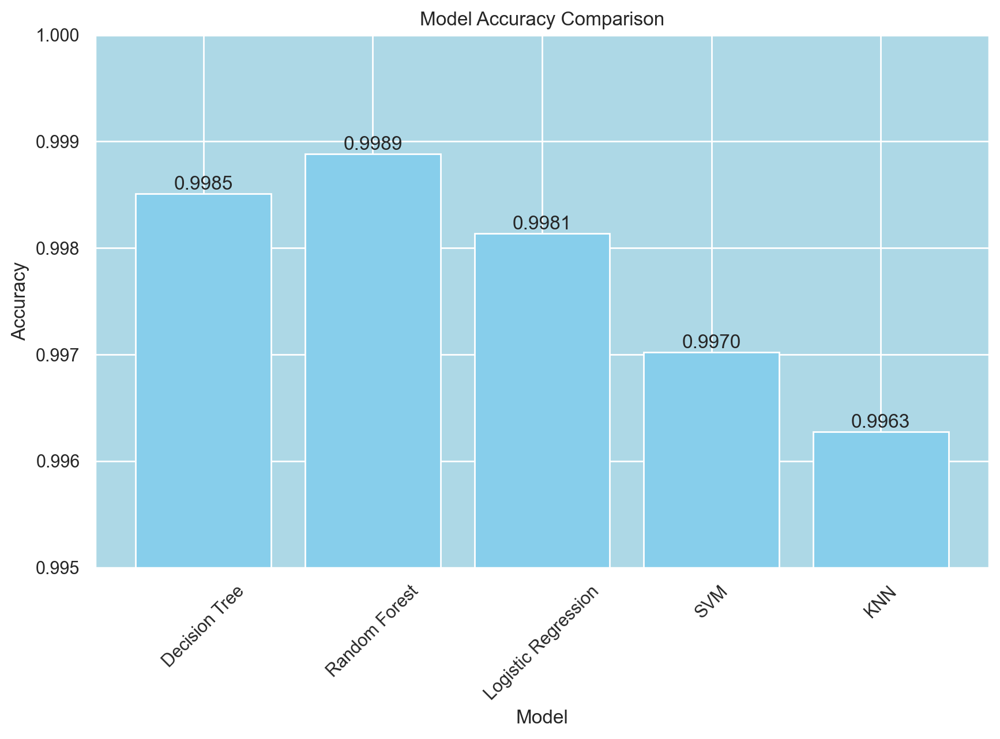

In [67]:

# Extract the accuracy scores from the combined results DataFrame
accuracy_df = results[results['Metric'] == 'accuracy'][['Model', 'precision']]

# Plotting the accuracies with zoomed-in Y-axis
plt.figure(figsize=(10, 6))
bars = plt.bar(accuracy_df['Model'], accuracy_df['precision'], color='skyblue')
plt.title('Model Accuracy Comparison')
plt.xlabel('Model')
plt.ylabel('Accuracy')

# Adjusting the y-axis limits for better visibility of differences
plt.ylim(0.995, 1)

# Adding text labels on top of the bars to show precise accuracy values
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        yval,
        f'{yval:.4f}',  # Display accuracy to 4 decimal places
        ha='center',
        va='bottom'
    )

plt.xticks(rotation=45)

# Display the plot
plt.show()


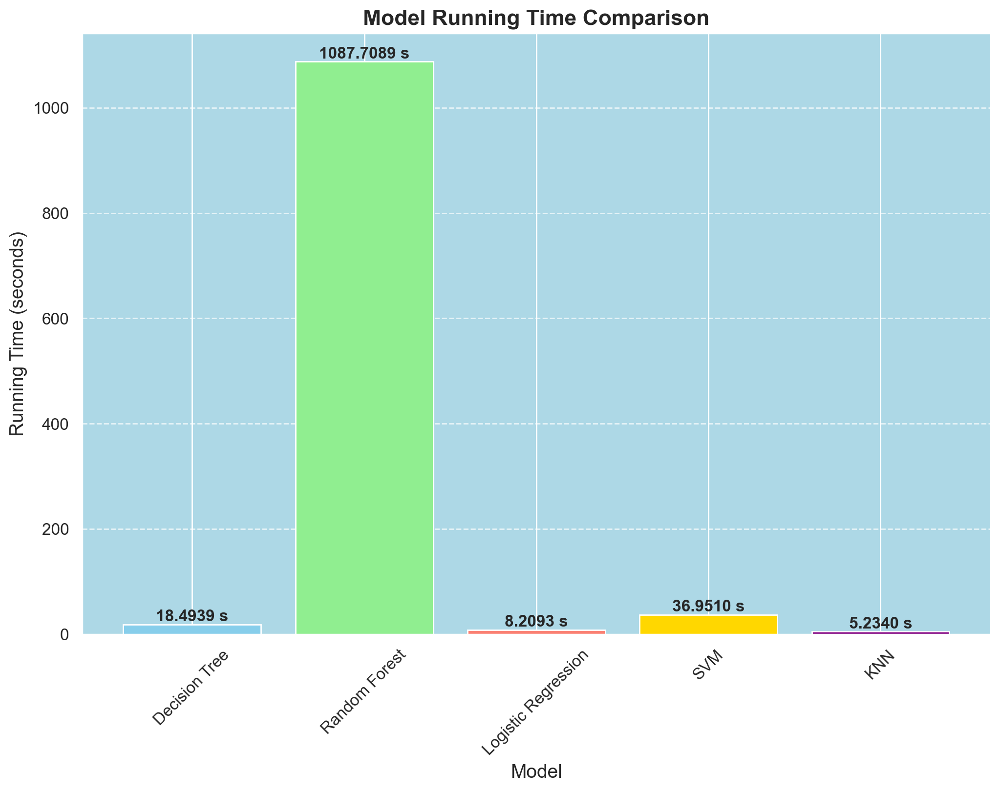

In [68]:
import matplotlib.pyplot as plt

# Model names and their corresponding running times
model_names = ['Decision Tree', 'Random Forest', 'Logistic Regression', 'SVM', 'KNN']
running_times = [dt_time, elapsed_time, lr_time, svm_time, knn_time]

# Plotting the running times
plt.figure(figsize=(12, 8))
bars = plt.bar(model_names, running_times, color=['skyblue', 'lightgreen', 'salmon', 'gold', 'purple'])

# Adding gridlines for better visibility
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adding titles and labels
plt.title('Model Running Time Comparison', fontsize=16, fontweight='bold')
plt.xlabel('Model', fontsize=14)
plt.ylabel('Running Time (seconds)', fontsize=14)

# Adding data labels on each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        yval + 0.01,  # Adjusting label position slightly above the bar
        f'{yval:.4f} s',  # Display running time to 4 decimal places
        ha='center',
        va='bottom',
        fontsize=12,
        fontweight='bold'
    )

plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)

# Display the plot
plt.show()


<div style="border-radius:15px 50px; padding: 15px; background-color: lightblue; font-size:130%; text-align:left; font-family: Arial; color: darkblue;">
    <h3 align="left" style="color:darkblue;">Conclusion:</h3>
    <ul>
        <li><strong>Model Performance</strong>: BDecision Tree model achieved the highest accuracy of <strong>0.9985</strong> on the dataset.</li>
        <li><strong>Training Time Comparison</strong>:</li>
        <ul>
            <li><strong>Decision Tree</strong>: Trained in <strong>9.5508 seconds</strong>, making it highly efficient.</li>
        </ul>
        <li><strong>Recommendation</strong>: Given the similar accuracy, the Decision Tree model is preferred for its faster training time and efficiency. It offers excellent performance with lower computational resources.</li>
        <li><strong>Future Considerations</strong>: Random Forest may still be valuable for its robustness, especially in scenarios where computational cost is less of a concern.</li>
    </ul>
</div>


⬆️ [Table of Contents](#contents_tabel)

<a id="prediction"></a>
# <h2 style="background-color:lightblue; font-family:Arial; color:darkblue; font-size:250%; text-align:center; border-radius:15px 50px; visibility:visible;">Step 12 | Prediction</h2>

In [69]:
# Function to make a prediction based on user input
def predict(features):
    return dt.predict(np.array(features).reshape(1, -1))

# Define feature names (replace with the actual feature names in your dataset)
feature_names = [
    "BALANCE", "BALANCE_FREQUENCY", "PURCHASES", "ONEOFF_PURCHASES",
    "INSTALLMENTS_PURCHASES", "CASH_ADVANCE", "PURCHASES_FREQUENCY",
    "ONEOFF_PURCHASES_FREQUENCY", "PURCHASES_INSTALLMENTS_FREQUENCY",
    "CASH_ADVANCE_FREQUENCY", "CASH_ADVANCE_TRX", "PURCHASES_TRX",
    "CREDIT_LIMIT", "PAYMENTS", "MINIMUM_PAYMENTS", "PRC_FULL_PAYMENT", "TENURE"
]

# Create input widgets
feature_widgets = [widgets.FloatText(value=0.0, description=f'{feature}:') for feature in feature_names]

# Create a button for making predictions
predict_button = widgets.Button(description="Predict")

# Output widget to display prediction
output_widget = widgets.Output()

# Function to handle button click event
def on_button_click(b):
    user_input = [float(widget.value) for widget in feature_widgets]
    prediction = predict(user_input)

    # Clear the previous output and display the new prediction
    with output_widget:
        output_widget.clear_output(wait=True)  # Clear previous output
        display(HTML(f"<b>Prediction:</b> {prediction[0]}"))

# Attach the button click event
predict_button.on_click(on_button_click)

# Display widgets and output area
display(*feature_widgets, predict_button, output_widget)


FloatText(value=0.0, description='BALANCE:')

FloatText(value=0.0, description='BALANCE_FREQUENCY:')

FloatText(value=0.0, description='PURCHASES:')

FloatText(value=0.0, description='ONEOFF_PURCHASES:')

FloatText(value=0.0, description='INSTALLMENTS_PURCHASES:')

FloatText(value=0.0, description='CASH_ADVANCE:')

FloatText(value=0.0, description='PURCHASES_FREQUENCY:')

FloatText(value=0.0, description='ONEOFF_PURCHASES_FREQUENCY:')

FloatText(value=0.0, description='PURCHASES_INSTALLMENTS_FREQUENCY:')

FloatText(value=0.0, description='CASH_ADVANCE_FREQUENCY:')

FloatText(value=0.0, description='CASH_ADVANCE_TRX:')

FloatText(value=0.0, description='PURCHASES_TRX:')

FloatText(value=0.0, description='CREDIT_LIMIT:')

FloatText(value=0.0, description='PAYMENTS:')

FloatText(value=0.0, description='MINIMUM_PAYMENTS:')

FloatText(value=0.0, description='PRC_FULL_PAYMENT:')

FloatText(value=0.0, description='TENURE:')

Button(description='Predict', style=ButtonStyle())

Output()

⬆️ [Table of Contents](#contents_tabel)